<p style="text-align: center;" ><font size="+3"><u><b>Laboratory 3 Part 2: Linear Systems Theory Applied to Optical Imaging Systems</u></b></p>

<p style="text-align: left;" ><font size="+1"><b>Measure the Point Spread Function of a Microscope</b></p>

<div class="alert alert-block alert-warning">
<font color='black'>

The microscope has been set up using 8” of optical tube (plus the filter wheel and aperture). We have placed two targets on the stage - the resolution target and a pinhole target. In addition, the glass diffuser have been removed from setup. Instead, as shown in the photo below, a piece of plastic has been placed underneath the resolution target to function as a diffuser. 

IMPORTANT: if you have a red camera, please add a 0.5" tube to your system
     </font> 
</div>

<img src="Lab3\stage.png" style="width:500px">

In [13]:
import os
import sys
sys.path.insert(0,r'BaITools')
sys.path.insert(0,r'dlls')

import numpy as np
from time import sleep
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import cv2
plt.rcParams['font.size'] = 16
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from zelux import ZeluxCamera as Camera


ModuleNotFoundError: No module named 'zelux'

In [3]:
print('Camera initialized as c')
c = Camera()
c.open()

c.get_properties()
c.set_exposure(10)
c.get_exposure()
c.set_framerate(2)
c.get_framerate()



c.set_exposure(30)

Camera initialized as c
Camera Model 	 Thorlabs CS165MU
Pixel Size 	 3.45  microns
Image size 	 [1440, 1080]
Exposure 	 30.31  ms
Exposure Range 	 [0.06, 26843.42]  ms
Framerate 	 18.0
Frame Range 	 [0.9, 18.0]


In [89]:
c.close()

In [12]:
def average_images(num_images):
    image_10bit_stack = []
    for i in range(num_images):
        image_10bit_stack.append(c.capture().copy())
        if (i+1) % 10 == 0:
            print("image number taken:", i+1)
    average_image_10bit = np.mean(image_10bit_stack, axis=0)

    return average_image_10bit

def capture_image(save_name="False"):
    image_10bit = c.capture().copy()
    x1,y1,x2,y2 = 650, 300, 850, 500
    cropped_image_10bit = image_10bit[y1:y2, x1:x2]

    fig, axes = plt.subplots(1, 2, figsize=(18, 5))

    im0 = axes[0].imshow(image_10bit, origin='lower', cmap='jet')
    axes[0].set_title(f"Original Image")
    axes[0].set_xlabel("X")
    axes[0].set_ylabel("Y")
    fig.colorbar(im0, ax=axes[0], label='Magnitude')

    im1 = axes[1].imshow(cropped_image_10bit, origin='lower', cmap='jet')
    axes[1].set_title(f"Cropped Image")
    axes[1].set_xlabel("X")
    axes[1].set_ylabel("Y")
    fig.colorbar(im1, ax=axes[1], label='Magnitude')

    plt.show()

    return image_10bit, cropped_image_10bit

def continuous_capture_jet(save_name="saved_image.png"):
    c.set_exposure(1000)
    while True:
        cv2.imshow('Camera', cv2.applyColorMap(cv2.normalize(c.capture().copy(), None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U), cv2.COLORMAP_JET)) #show 8 bit image
        if cv2.waitKey(30) & 0xFF == ord('s'):
            image = c.capture().copy()
            fig, ax = plt.subplots(1, figsize=(12, 5))
            x = ax.imshow(image, cmap='jet')
            fig.colorbar(x, ax=ax)
            ax.set_xlabel('X Axis pixels')
            ax.set_ylabel('Y Axis pixels')
            plt.savefig(save_name)
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()
    return image

def continuous_capture(save_name="saved_image.png"):
    while True:
        cv2.imshow('Camera', cv2.normalize(c.capture().copy(), None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)) #show 8 bit image
        if cv2.waitKey(30) & 0xFF == ord('s'):
            image = c.capture().copy()
            fig, ax = plt.subplots(1, figsize=(12, 5))
            x = ax.imshow(image, cmap='jet')
            fig.colorbar(x, ax=ax)
            ax.set_xlabel('X Axis pixels')
            ax.set_ylabel('Y Axis pixels')
            plt.savefig(save_name)
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    cv2.destroyAllWindows()
    return image

def get_magnification():
    image_10bit = continuous_capture()

    %matplotlib widget

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_axes([0.1, 0.3, 0.6, 0.6])

    ax_divider = make_axes_locatable(ax)
    cax = ax_divider.append_axes("right", size="7%", pad="2%")

    im = ax.imshow(image_10bit, cmap='gray')
    cb = fig.colorbar(im, cax=cax)

    hfig = display(fig, display_id=True)
    plt.show()

def calculate_magnification(x1, y1, x2, y2, grid_size=100e-6, camera_size = 3.45e-6):
    d_squared = (x1-x2)**2 + (y1-y2)**2
    d = np.sqrt(d_squared) #number of pixels between grid_size um

    pixel_size_object = grid_size / d
    print('Pixel size of camera:', camera_size)
    print('Pixel size in object plane:', pixel_size_object)

    magnification = camera_size / pixel_size_object
    print('Magnification:', magnification)

    return magnification, pixel_size_object

def calculate_objectsamplingfrequency(pixel_size_object):
    object_sampling_frequency = 1 / pixel_size_object # in 1 / m
    object_sampling_frequency_mm = object_sampling_frequency / 1000
    print('Object sampling frequency in mm:', object_sampling_frequency_mm)
    return object_sampling_frequency

def show_image_fourier(image_10bit, name=""):
    D_shifted = ifftshift(image_10bit)
    D_fourier = fft2(D_shifted)
    D_fourier_shifted = fftshift(D_fourier)

    D_fourier_magnitude = np.abs(D_fourier_shifted)
    D_fourier_magnitude_log = np.log(D_fourier_magnitude)

    fig, axes = plt.subplots(1, 2, figsize=(18, 5))

    #image
    im0 = axes[0].imshow(image_10bit, origin='lower', cmap='gray')
    axes[0].set_title(f"Original Image - {name}")
    axes[0].set_xlabel("Frequency X (1/mm)")
    axes[0].set_ylabel("Frequency Y (1/mm)")
    fig.colorbar(im0, ax=axes[0], label='Magnitude')

    #fourier
    im1 = axes[1].imshow(D_fourier_magnitude_log, origin='lower', cmap='gray')
    axes[1].set_title(f"Fourier Transform Magnitude Log Scale - {name}")
    axes[1].set_xlabel("Frequency X (1/mm)")
    axes[1].set_ylabel("Frequency Y (1/mm)")
    fig.colorbar(im1, ax=axes[1], label='Magnitude (log scale)')

    plt.show()

    return D_fourier_magnitude_log

def zoom_image(image, x1, y1, x2, y2):
    zoomed = image[y1:y2, x1:x2]

    plt.figure(figsize=(7,7))
    plt.imshow(zoomed, cmap='jet')
    plt.title('Zoomed-In Image')
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.show()
    plt.savefig('zoomed_image.png')
    return zoomed

def show_zoomed(image, darkfield, x1, y1, x2, y2, 
                image_name="Original Image", 
                cropped_image_name="Cropped Image", 
                mm_per_pixel=(3.45e-6*1000), vmin=0, vmax=200):

    # Cropping and subtracting darkfield
    cropped_image = image[y1:y2, x1:x2]
    image_absolute = image - darkfield
    cropped_image_absolute = cropped_image - darkfield[y1:y2, x1:x2]

    # Extents in mm
    full_height, full_width = image.shape
    cropped_height, cropped_width = cropped_image.shape
    extent = [0, full_width * mm_per_pixel, 0, full_height * mm_per_pixel]
    cropped_extent = [0, cropped_width * mm_per_pixel, 0, cropped_height * mm_per_pixel]

    # Set up plot
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Helper to format axes
    def format_axis(ax):
        ax.set_xlabel("X (mm)", fontsize=12)
        ax.set_ylabel("Y (mm)", fontsize=12)
        ax.ticklabel_format(style='plain', axis='x')
        ax.ticklabel_format(style='plain', axis='y')
        ax.tick_params(labelsize=10)

    # Plot 1 - Full Image
    im0 = axes[0][0].imshow(image, origin='lower', cmap='jet', extent=extent, vmin=vmin, vmax=vmax)
    axes[0][0].set_title(image_name, fontsize=14)
    format_axis(axes[0][0])
    fig.colorbar(im0, ax=axes[0][0], label='Magnitude')

    # Plot 2 - Cropped Image
    im1 = axes[1][0].imshow(cropped_image, origin='lower', cmap='jet', extent=cropped_extent, vmin=vmin, vmax=vmax)
    axes[1][0].set_title(cropped_image_name, fontsize=14)
    format_axis(axes[1][0])
    fig.colorbar(im1, ax=axes[1][0], label='Magnitude')

    # Plot 3 - Full Image - Darkfield Subtracted
    im2 = axes[0][1].imshow(image_absolute, origin='lower', cmap='jet', extent=extent, vmin=vmin, vmax=vmax)
    axes[0][1].set_title(f"{image_name} - Darkfield", fontsize=14)
    format_axis(axes[0][1])
    fig.colorbar(im2, ax=axes[0][1], label='Magnitude')

    # Plot 4 - Cropped Image - Darkfield Subtracted
    im3 = axes[1][1].imshow(cropped_image_absolute, origin='lower', cmap='jet', extent=cropped_extent, vmin=vmin, vmax=vmax)
    axes[1][1].set_title(f"{cropped_image_name} - Darkfield", fontsize=14)
    format_axis(axes[1][1])
    fig.colorbar(im3, ax=axes[1][1], label='Magnitude')

    plt.tight_layout()
    plt.show()

    return image, image_absolute, cropped_image, cropped_image_absolute


<div class="alert alert-block alert-success">
<font color='black'>
1. Move the stage to find the resolution target. As you have done previously, compute the pixel size, magnification, and sampling frequency and report below:
         </font> 
</div>

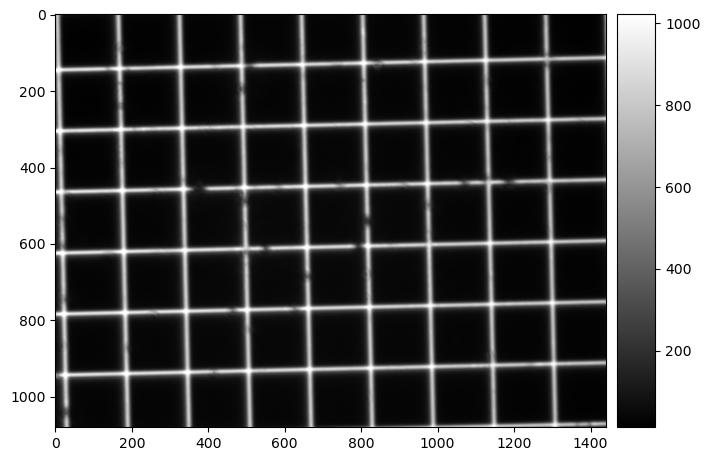

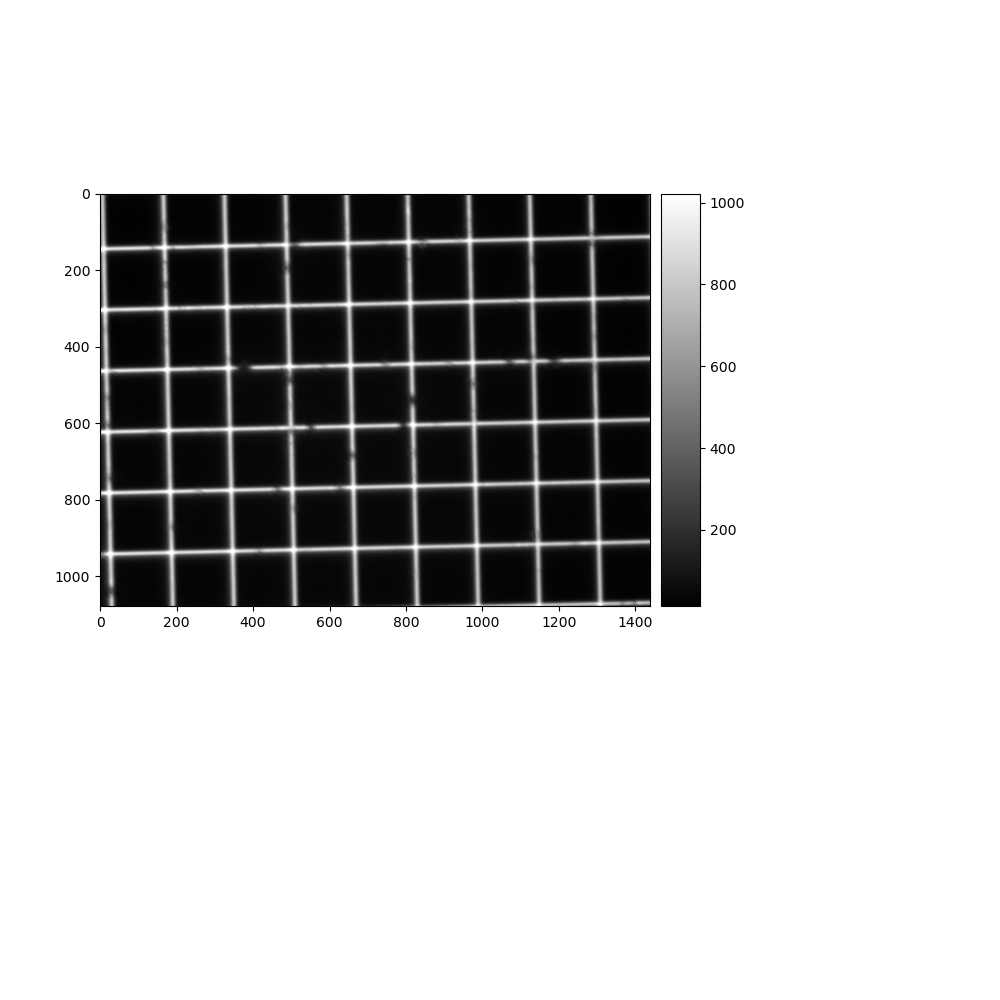

In [4]:
get_magnification()

In [5]:
x1, y1, x2, y2 = 20, 777, 1302, 748
magnification, pixel_size_object = calculate_magnification(x1, y1, x2, y2, grid_size=800e-6, camera_size=3.45e-6)
calculate_objectsamplingfrequency(pixel_size_object)

Pixel size of camera: 3.45e-06
Pixel size in object plane: 6.238653637948366e-07
Magnification: 5.5300393325482995
Object sampling frequency in mm: 1602.909951463275


1602909.9514632751

In [6]:
%matplotlib inline

In [7]:
focus_image = continuous_capture()

UnboundLocalError: local variable 'image' referenced before assignment

<div class="alert alert-block alert-warning">
<font color='black'>

Now find the pinhole. The pinhole lets through very little light and can be difficult to find. Thus, you will go through a very specific process to be able to find the pinhole and collect good data. <br/> <br/>

First, set your system to the “no filter” setting. Turn up the LED illuminator to the maximum setting. Also, the illuminator will get warm while in use. **Remember to turn off the illuminator after each data collection.<br/><br/>

Set the camera exposure to something long like 1000 ms. (To do this you will likely need to reduce the framerate below 1 frame/second by setting `c.set_framerate()`). You may need to tweak this exposure setting to get good (unsaturated) data. Set up your system in a continuous display loop as you have in previous labs and start searching for the pinhole. Having your axes aligned and moving slowly will be critical to find the pinhole. Similarly, you will need to be somewhat close to focus in order to see the pinhole. In this lab, it may be helpful to use `cmap='jet'` to visualize your data.<br/><br/>
    
Once you have found the pinhole, change your live image to display only a 200 x 200 pixel region around the pinhole. **Change the filter to filter 2 (“green” 540 nm).** Attempt to get the image focused as best as you can. If the image is saturated, adjust the exposure accordingly. <br/><br/>
    
You may notice that the background isn’t entirely dark. Recall from Lab 1 that even when no light hits the detector you can read non-zero values. We will need to correct for this. Without changing any part of the setup, turn off the illuminator (e.g. set intensity to zero) and collect 50 dark frames to subtract from your data. (We will not be conducting an air scan to normalize the data.) Turn the illuminator back on when finished.

</font> 
</div>

<div class="alert alert-block alert-success">
<font color='black'>

2. Center your pinhole as best as you can within a 200 x 200 zoomed image at the best focus you can achieve. (Hint, the best focus will have the highest value at the center of the pinhole.) Average 100 images to obtain an image of your pinhole. <br/><br/>  
    
Paste that image below. Additionally, re-window (using `clim`) your data to show as many sidelobes as you can in your data, and show that image as well.  Also, save your data (e.g. `np.save('wide_aperture.npy', mean_image)`).
</font> 
</div>

In [76]:
c.set_exposure(1000)
c.set_framerate(1)


pinhole = continuous_capture_jet()

UnboundLocalError: local variable 'image' referenced before assignment

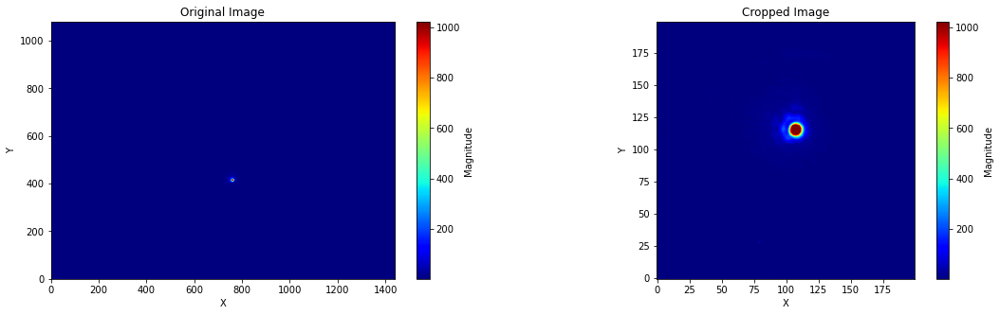

(array([[2, 2, 2, ..., 2, 2, 2],
        [3, 1, 2, ..., 2, 1, 2],
        [2, 3, 2, ..., 2, 1, 2],
        ...,
        [3, 3, 2, ..., 2, 3, 3],
        [2, 1, 2, ..., 2, 2, 2],
        [2, 1, 2, ..., 3, 3, 2]], dtype=uint16),
 array([[2, 2, 2, ..., 2, 2, 2],
        [1, 2, 3, ..., 1, 2, 2],
        [5, 2, 2, ..., 2, 2, 1],
        ...,
        [3, 3, 2, ..., 3, 2, 2],
        [2, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 2, 3]], dtype=uint16))

In [51]:
capture_image("pinhole_nofilter")

In [59]:
green_darkfield = average_images(50)
np.save('green_darkfield', green_darkfield)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50


In [60]:
print(np.shape(green_darkfield))

(1080, 1440)


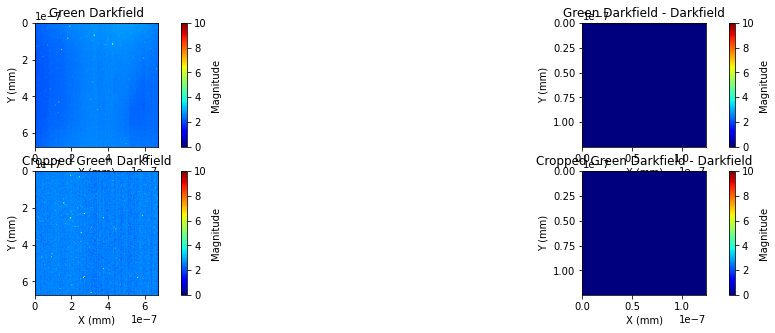

(array([[1.96, 2.1 , 1.98, ..., 2.52, 2.42, 2.26],
        [2.2 , 2.04, 1.9 , ..., 2.44, 2.06, 2.2 ],
        [1.94, 2.22, 1.92, ..., 2.36, 2.68, 2.52],
        ...,
        [1.96, 2.48, 1.94, ..., 2.34, 2.8 , 2.36],
        [2.22, 2.34, 2.12, ..., 2.56, 2.44, 2.38],
        [2.36, 2.12, 2.26, ..., 2.32, 2.58, 2.5 ]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([[2.46, 2.68, 2.52, ..., 2.4 , 2.72, 2.66],
        [2.66, 2.68, 2.5 , ..., 2.14, 2.34, 2.44],
        [4.52, 2.54, 2.56, ..., 2.58, 2.74, 2.68],
        ...,
        [2.6 , 2.56, 2.34, ..., 2.52, 2.68, 2.66],
        [2.36, 2.6 , 2.48, ..., 2.5 , 2.6 , 2.54],
        [2.64, 2.78, 2.38, ..., 2.44, 2.46, 2.6 ]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0

In [ ]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 10
show_zoomed(green_darkfield, green_darkfield, x1, y1, x2, y2, image_name='Green Darkfield', cropped_image_name='Cropped Green Darkfield', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

In [53]:
wide_green = average_images(100)
np.save('wide_green', wide_green)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


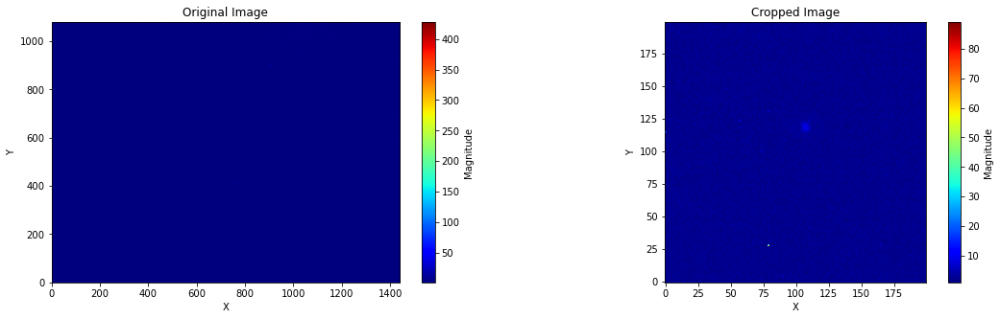

(array([[2, 3, 1, ..., 2, 2, 3],
        [2, 2, 2, ..., 3, 2, 2],
        [3, 3, 2, ..., 3, 1, 3],
        ...,
        [2, 2, 2, ..., 2, 3, 2],
        [3, 2, 2, ..., 2, 2, 3],
        [2, 1, 2, ..., 2, 3, 2]], dtype=uint16),
 array([[2, 2, 3, ..., 2, 3, 2],
        [3, 2, 2, ..., 1, 3, 2],
        [4, 2, 3, ..., 2, 1, 3],
        ...,
        [2, 2, 2, ..., 1, 2, 2],
        [3, 2, 2, ..., 3, 2, 2],
        [3, 2, 2, ..., 2, 2, 3]], dtype=uint16))

In [54]:
capture_image("pinhole_greenfilter")

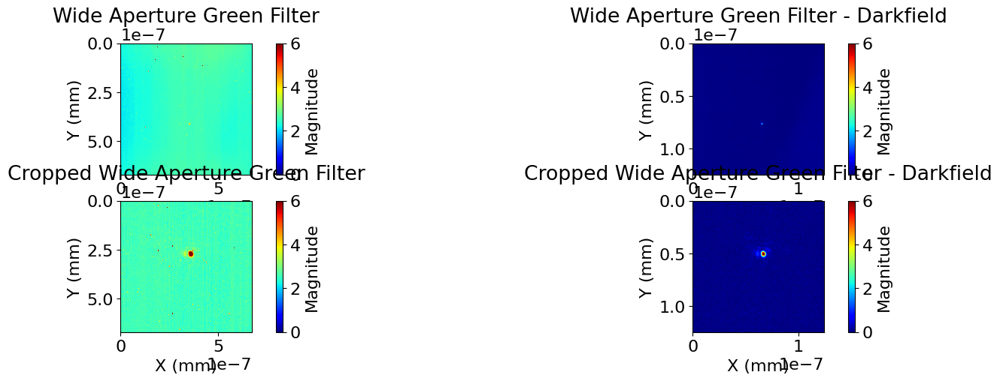

(array([[2.11, 2.25, 2.  , ..., 2.48, 2.42, 2.4 ],
        [2.3 , 2.16, 2.02, ..., 2.51, 2.21, 2.39],
        [1.93, 2.26, 1.84, ..., 2.63, 2.66, 2.45],
        ...,
        [2.13, 2.59, 2.1 , ..., 2.36, 2.78, 2.56],
        [2.3 , 2.34, 2.19, ..., 2.41, 2.5 , 2.53],
        [2.32, 2.31, 2.48, ..., 2.54, 2.67, 2.49]]),
 array([[ 0.15,  0.15,  0.02, ..., -0.04,  0.  ,  0.14],
        [ 0.1 ,  0.12,  0.12, ...,  0.07,  0.15,  0.19],
        [-0.01,  0.04, -0.08, ...,  0.27, -0.02, -0.07],
        ...,
        [ 0.17,  0.11,  0.16, ...,  0.02, -0.02,  0.2 ],
        [ 0.08,  0.  ,  0.07, ..., -0.15,  0.06,  0.15],
        [-0.04,  0.19,  0.22, ...,  0.22,  0.09, -0.01]]),
 array([[2.42, 2.68, 2.5 , ..., 2.46, 2.67, 2.65],
        [2.72, 2.69, 2.6 , ..., 2.29, 2.47, 2.71],
        [4.48, 2.52, 2.51, ..., 2.39, 2.63, 2.54],
        ...,
        [2.71, 2.65, 2.35, ..., 2.4 , 2.61, 2.7 ],
        [2.45, 2.55, 2.56, ..., 2.59, 2.73, 2.53],
        [2.79, 2.69, 2.4 , ..., 2.49, 2.55, 2.64]]),
 

In [ ]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 6
show_zoomed(wide_green, green_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Green Filter', cropped_image_name='Cropped Wide Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

<div class="alert alert-block alert-success">
<font color='black'>

3. Repeat the above experiment with two additional aperture settings (medium and small). (Note that you should not have to change focus, but changing the exposure time will require new dark frame data.) Save `medium_aperture.npy` and `small_aperture.npy` as well. 
</font> 
</div>

<img src="Lab3\aperture.png" style="width:800px">
Example aperture position: wide open (100% open), medium aperture (60% open), small aperture (30% open)

In [63]:
medium_green = average_images(100)
np.save("medium_green", medium_green)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


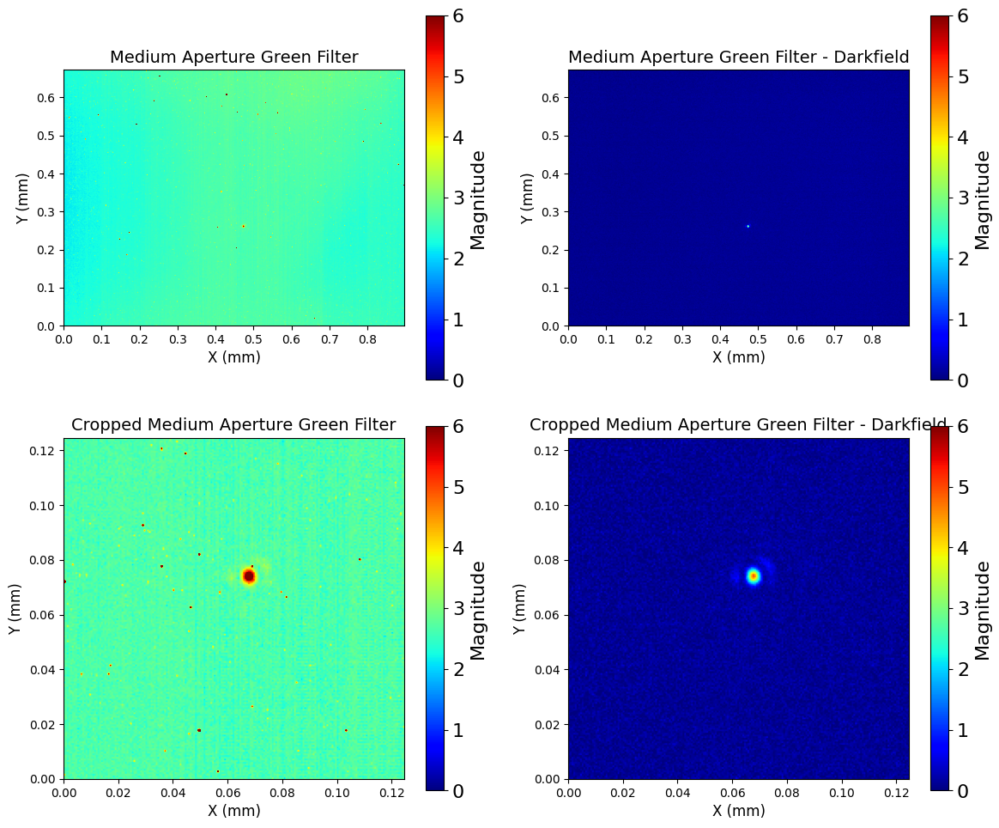

(array([[2.08, 2.26, 1.91, ..., 2.44, 2.56, 2.52],
        [2.42, 2.12, 2.18, ..., 2.45, 2.14, 2.32],
        [2.12, 2.38, 2.02, ..., 2.5 , 2.65, 2.54],
        ...,
        [2.2 , 2.49, 2.26, ..., 2.59, 2.93, 2.67],
        [2.45, 2.46, 2.22, ..., 2.45, 2.7 , 2.55],
        [2.27, 2.25, 2.58, ..., 2.65, 2.84, 2.7 ]]),
 array([[ 0.12,  0.16, -0.07, ..., -0.08,  0.14,  0.26],
        [ 0.22,  0.08,  0.28, ...,  0.01,  0.08,  0.12],
        [ 0.18,  0.16,  0.1 , ...,  0.14, -0.03,  0.02],
        ...,
        [ 0.24,  0.01,  0.32, ...,  0.25,  0.13,  0.31],
        [ 0.23,  0.12,  0.1 , ..., -0.11,  0.26,  0.17],
        [-0.09,  0.13,  0.32, ...,  0.33,  0.26,  0.2 ]]),
 array([[2.55, 2.9 , 2.76, ..., 2.64, 2.78, 2.71],
        [2.69, 2.75, 2.6 , ..., 2.44, 2.57, 2.7 ],
        [4.53, 2.65, 2.65, ..., 2.59, 2.78, 2.68],
        ...,
        [2.85, 2.8 , 2.56, ..., 2.42, 2.76, 2.77],
        [2.45, 2.83, 2.57, ..., 2.53, 2.79, 2.75],
        [2.81, 2.94, 2.48, ..., 2.58, 2.8 , 2.76]]),
 

In [23]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 6
show_zoomed(medium_green, green_darkfield, x1, y1, x2, y2, image_name='Medium Aperture Green Filter', cropped_image_name='Cropped Medium Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

In [67]:
low_green = average_images(100)
np.save("low_green", low_green)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


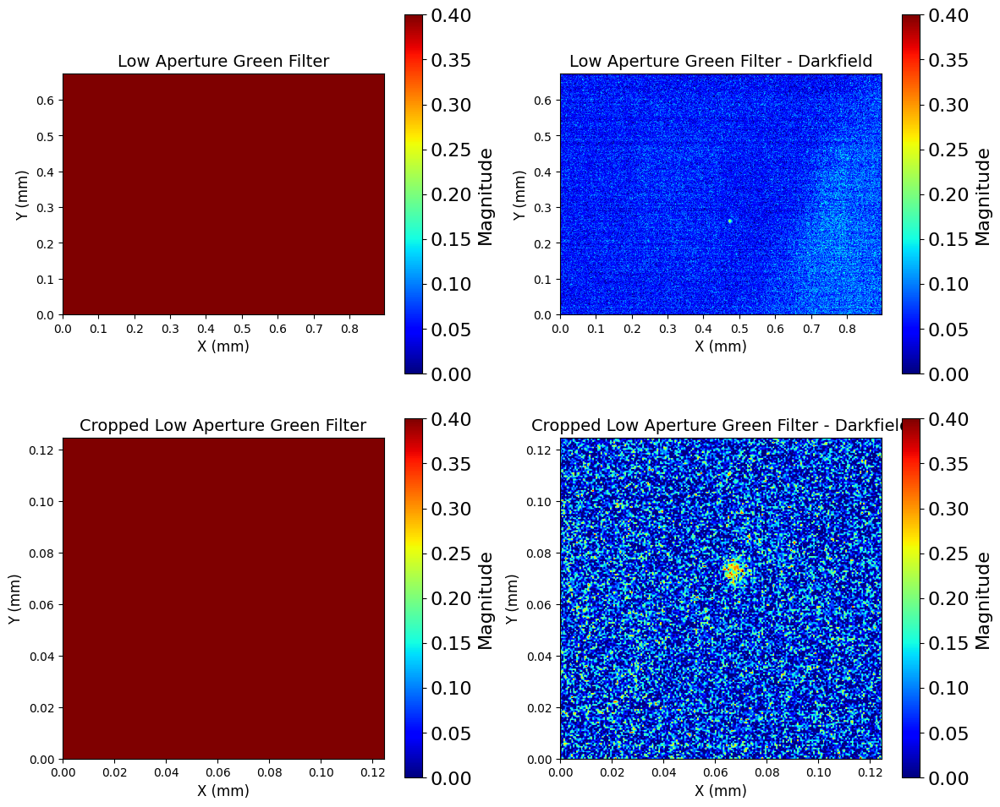

(array([[2.15, 2.2 , 2.09, ..., 2.55, 2.53, 2.46],
        [2.39, 2.25, 2.16, ..., 2.53, 2.02, 2.19],
        [2.02, 2.28, 2.  , ..., 2.6 , 2.8 , 2.56],
        ...,
        [2.05, 2.46, 2.14, ..., 2.55, 2.82, 2.48],
        [2.36, 2.29, 2.11, ..., 2.39, 2.6 , 2.4 ],
        [2.2 , 2.3 , 2.35, ..., 2.61, 2.71, 2.57]]),
 array([[ 0.19,  0.1 ,  0.11, ...,  0.03,  0.11,  0.2 ],
        [ 0.19,  0.21,  0.26, ...,  0.09, -0.04, -0.01],
        [ 0.08,  0.06,  0.08, ...,  0.24,  0.12,  0.04],
        ...,
        [ 0.09, -0.02,  0.2 , ...,  0.21,  0.02,  0.12],
        [ 0.14, -0.05, -0.01, ..., -0.17,  0.16,  0.02],
        [-0.16,  0.18,  0.09, ...,  0.29,  0.13,  0.07]]),
 array([[2.52, 2.9 , 2.59, ..., 2.69, 2.74, 2.8 ],
        [2.69, 2.78, 2.45, ..., 2.19, 2.63, 2.6 ],
        [4.47, 2.57, 2.45, ..., 2.6 , 2.71, 2.55],
        ...,
        [2.69, 2.58, 2.37, ..., 2.48, 2.7 , 2.77],
        [2.43, 2.67, 2.59, ..., 2.62, 2.72, 2.58],
        [2.56, 2.79, 2.34, ..., 2.47, 2.61, 2.72]]),
 

In [22]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 0.4
show_zoomed(low_green, green_darkfield, x1, y1, x2, y2, image_name='Low Aperture Green Filter', cropped_image_name='Cropped Low Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

<div class="alert alert-block alert-success">
<font color='black'>

4. Show the averaged, 200 x 200 images (both normal and “zoomed” `clim`) below. Discuss the effect of aperture on the appearance of the pinhole.
</font> 
</div>

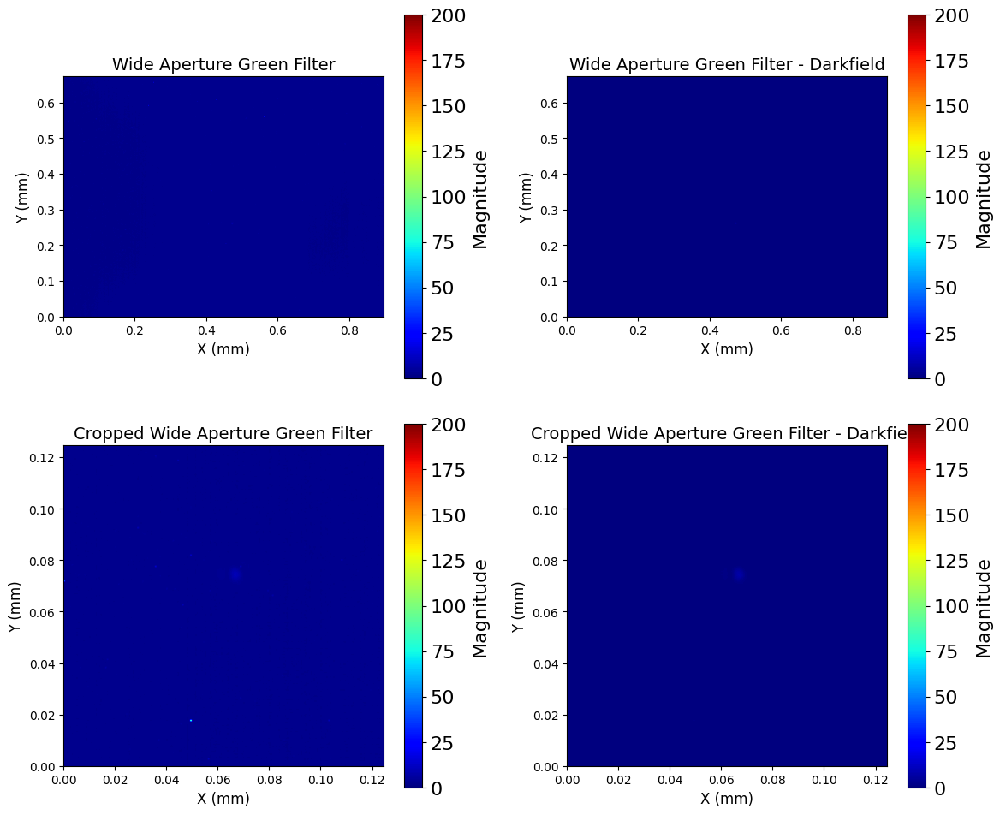

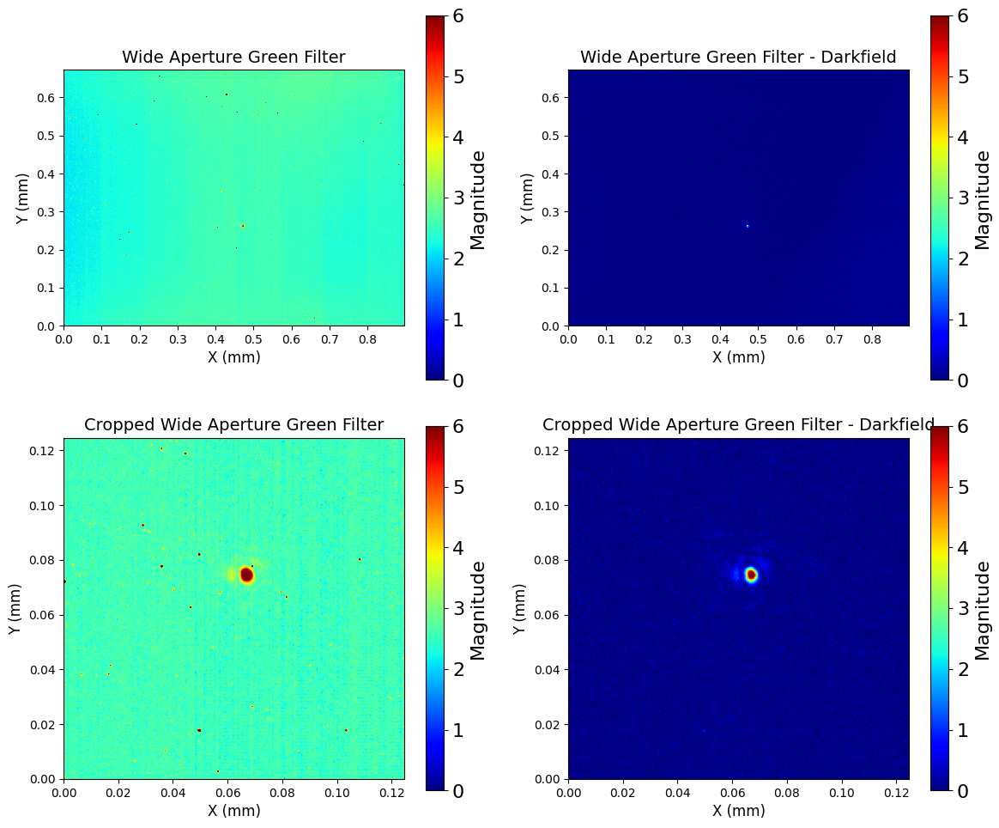

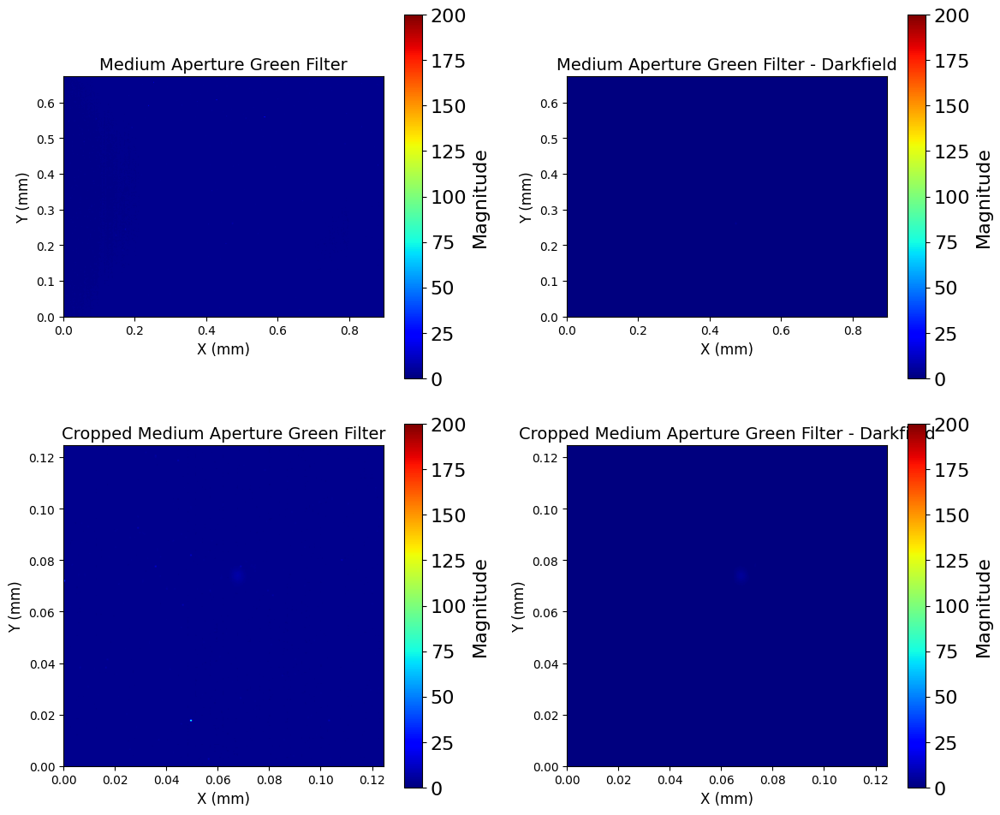

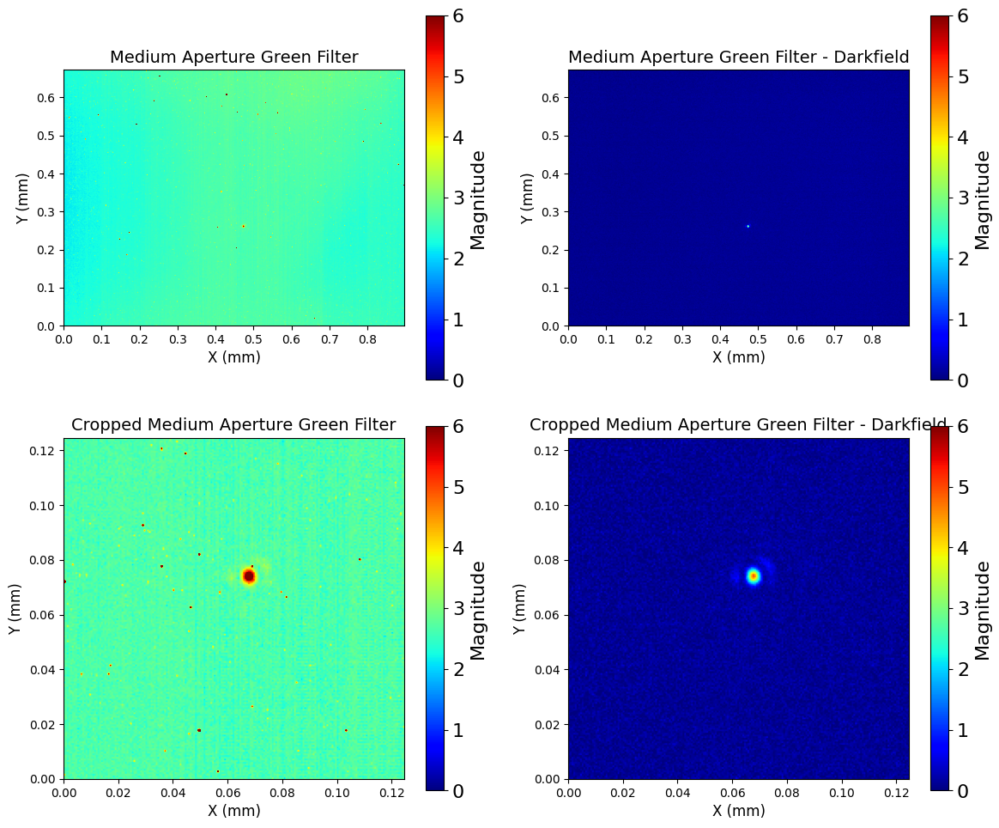

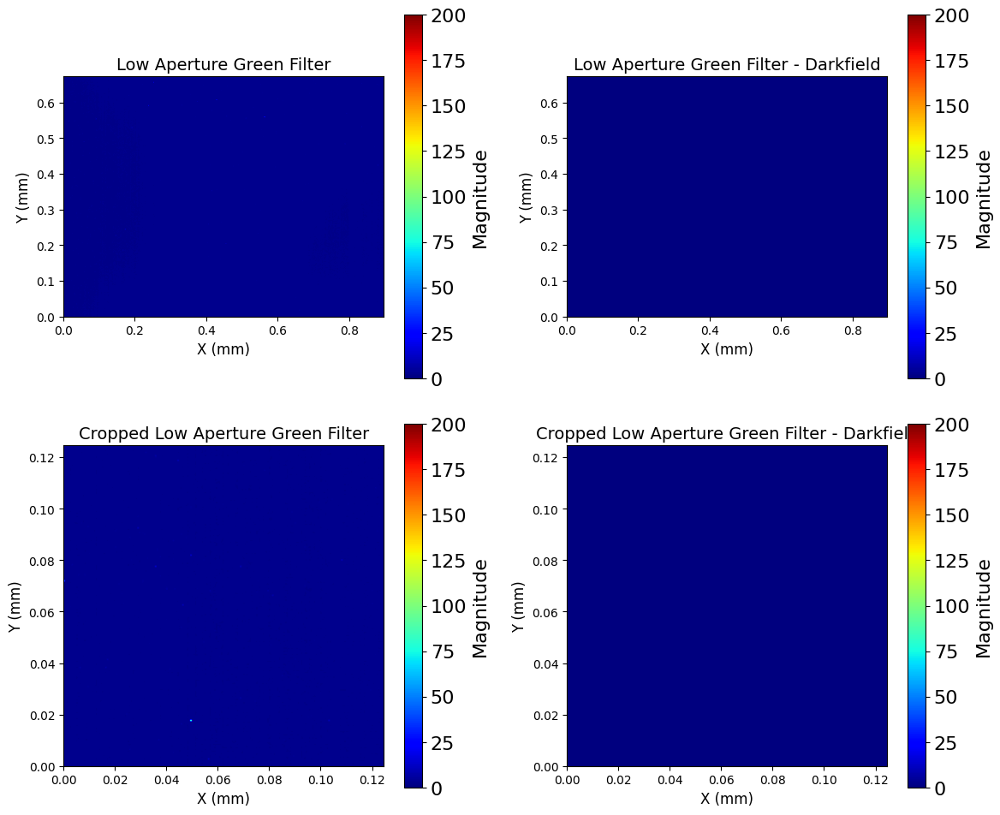

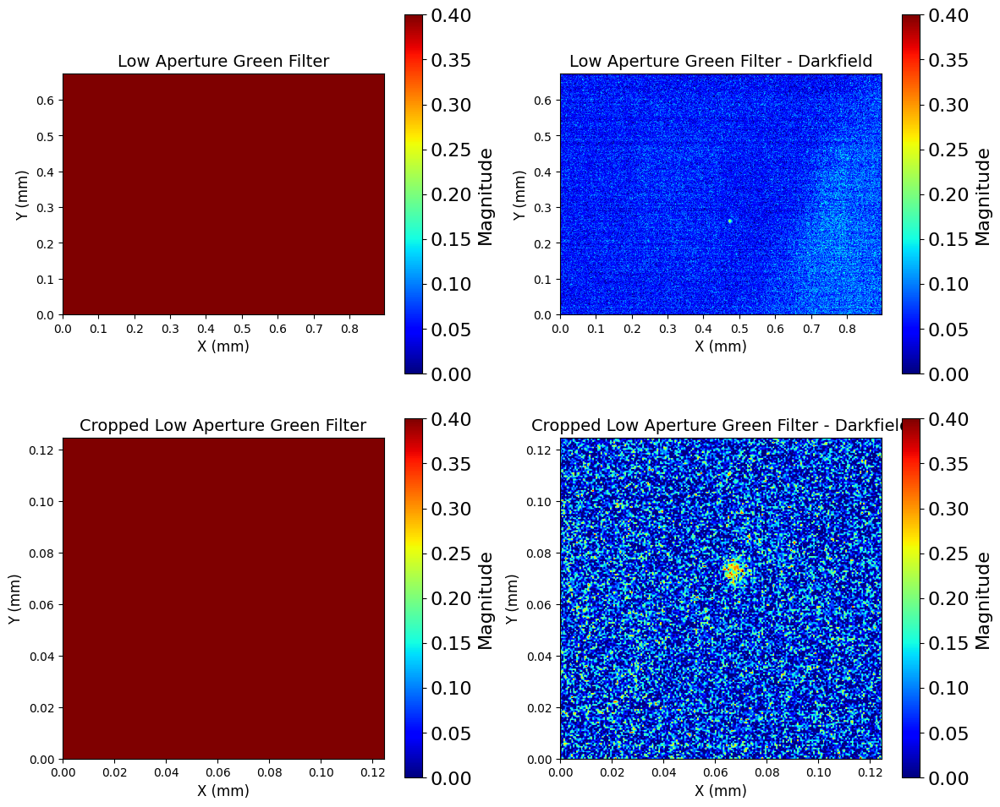

(array([[2.15, 2.2 , 2.09, ..., 2.55, 2.53, 2.46],
        [2.39, 2.25, 2.16, ..., 2.53, 2.02, 2.19],
        [2.02, 2.28, 2.  , ..., 2.6 , 2.8 , 2.56],
        ...,
        [2.05, 2.46, 2.14, ..., 2.55, 2.82, 2.48],
        [2.36, 2.29, 2.11, ..., 2.39, 2.6 , 2.4 ],
        [2.2 , 2.3 , 2.35, ..., 2.61, 2.71, 2.57]]),
 array([[ 0.19,  0.1 ,  0.11, ...,  0.03,  0.11,  0.2 ],
        [ 0.19,  0.21,  0.26, ...,  0.09, -0.04, -0.01],
        [ 0.08,  0.06,  0.08, ...,  0.24,  0.12,  0.04],
        ...,
        [ 0.09, -0.02,  0.2 , ...,  0.21,  0.02,  0.12],
        [ 0.14, -0.05, -0.01, ..., -0.17,  0.16,  0.02],
        [-0.16,  0.18,  0.09, ...,  0.29,  0.13,  0.07]]),
 array([[2.52, 2.9 , 2.59, ..., 2.69, 2.74, 2.8 ],
        [2.69, 2.78, 2.45, ..., 2.19, 2.63, 2.6 ],
        [4.47, 2.57, 2.45, ..., 2.6 , 2.71, 2.55],
        ...,
        [2.69, 2.58, 2.37, ..., 2.48, 2.7 , 2.77],
        [2.43, 2.67, 2.59, ..., 2.62, 2.72, 2.58],
        [2.56, 2.79, 2.34, ..., 2.47, 2.61, 2.72]]),
 

In [20]:
vmin, vmax = 0, 200
show_zoomed(wide_green, green_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Green Filter', cropped_image_name='Cropped Wide Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
vmin, vmax = 0, 6
show_zoomed(wide_green, green_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Green Filter', cropped_image_name='Cropped Wide Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
vmin, vmax = 0, 200
show_zoomed(medium_green, green_darkfield, x1, y1, x2, y2, image_name='Medium Aperture Green Filter', cropped_image_name='Cropped Medium Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
vmin, vmax = 0, 6
show_zoomed(medium_green, green_darkfield, x1, y1, x2, y2, image_name='Medium Aperture Green Filter', cropped_image_name='Cropped Medium Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
vmin, vmax = 0, 200
show_zoomed(low_green, green_darkfield, x1, y1, x2, y2, image_name='Low Aperture Green Filter', cropped_image_name='Cropped Low Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
vmin, vmax = 0, 0.4
show_zoomed(low_green, green_darkfield, x1, y1, x2, y2, image_name='Low Aperture Green Filter', cropped_image_name='Cropped Low Aperture Green Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)


As the aperture increases, the intensity and size of the pinhole increases. More light is let into the camera through the aperture when it is at max opening, resulting in more sidelobes. At low aperture setting, less light is provided, thus the light is less intense; however, there are less side lobes, creating a sharper image. As a result, the best image is produced at a moderate aperture setting as it balances intensity and clarity.

<div class="alert alert-block alert-success">
<font color='black'>

5. For your 3 data sets above (you saved data for wide, medium, and small apertures), estimate the diameter of the first dark ring around your pinhole images. Report each below with units:
</font> 
</div>

Wide -> 0.006 mm in diameter 

Medium -> 0.004 mm in diameter 

Low -> practically nonexistent, approximately 0.001 mm

<div class="alert alert-block alert-success">
<font color='black'>

6. For your 3 data sets above, show the absolute value of the Fourier transform of your data using `ax.plot_surface()`. What are you looking at? Describe what you see and estimate the “diameter” of the function you observe. (Note: If you have a “spike” at your DC value, talk to the instructors for a remedy.) </font> 
</div>

In [18]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

def plotsurface_mm(data, mm_per_pixel=(3.45e-6 * 1000), title="FFT Magnitude Surface", zlim=None, use_log=True):
    # Remove DC spike
    data_centered = data - np.mean(data)
    fft_result = np.fft.fftshift(np.fft.fft2(data_centered))

    # Magnitude (optionally log-scaled for dynamic range compression)
    if use_log:
        fft_magnitude = np.log1p(np.abs(fft_result))
    else:
        fft_magnitude = np.abs(fft_result)

    # Frequency axes in cycles/mm
    N, M = data.shape
    fx = np.fft.fftshift(np.fft.fftfreq(M, d=mm_per_pixel))  # X in mm⁻¹
    fy = np.fft.fftshift(np.fft.fftfreq(N, d=mm_per_pixel))  # Y in mm⁻¹
    FX, FY = np.meshgrid(fx, fy)

    # Plotting
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(FX, FY, fft_magnitude, cmap='viridis', linewidth=0, antialiased=False)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Frequency X (1/mm)", fontsize=12)
    ax.set_ylabel("Frequency Y (1/mm)", fontsize=12)
    ax.set_zlabel("Magnitude", fontsize=12)

    if zlim:
        ax.set_zlim(*zlim)
    fig.colorbar(surf, shrink=0.5, aspect=10)
    plt.tight_layout()
    plt.show()

    return fft_magnitude, fx, fy

def fft_diameter_widget(data, mm_per_pixel=(3.45e-6 * 1000), use_log=True):
    # Preprocess: Remove DC spike
    data_centered = data - np.mean(data)
    fft_result = np.fft.fftshift(np.fft.fft2(data_centered))
    
    fft_magnitude = np.log1p(np.abs(fft_result)) if use_log else np.abs(fft_result)
    
    # Axes in mm⁻¹
    N, M = data.shape
    fx = np.fft.fftshift(np.fft.fftfreq(M, d=mm_per_pixel))
    fy = np.fft.fftshift(np.fft.fftfreq(N, d=mm_per_pixel))
    extent = [fx[0], fx[-1], fy[0], fy[-1]]

    # Enable interactive mode
    %matplotlib widget

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_axes([0.1, 0.3, 0.6, 0.6])

    ax_divider = make_axes_locatable(ax)
    cax = ax_divider.append_axes("right", size="7%", pad="2%")

    im = ax.imshow(fft_magnitude, cmap='gray', origin='lower', extent=extent)
    cb = fig.colorbar(im, cax=cax)

    # Label axes with proper units
    ax.set_xlabel("Frequency X (1/mm)")
    ax.set_ylabel("Frequency Y (1/mm)")

    # Set title
    ax.set_title("FFT Magnitude (log scale)" if use_log else "FFT Magnitude")

    hfig = display(fig, display_id=True)
    plt.show()

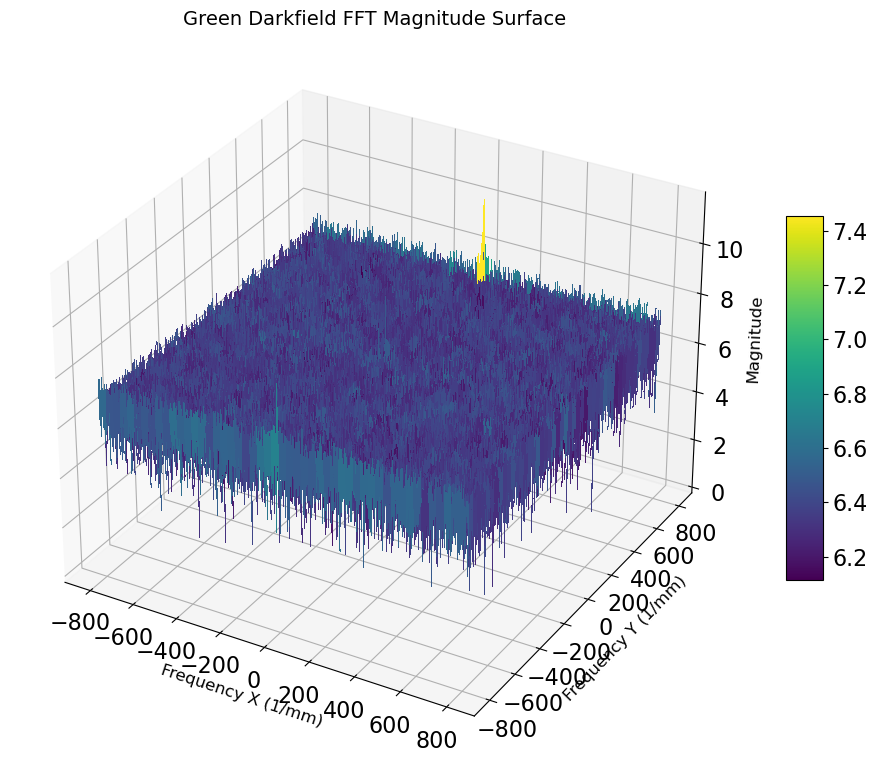

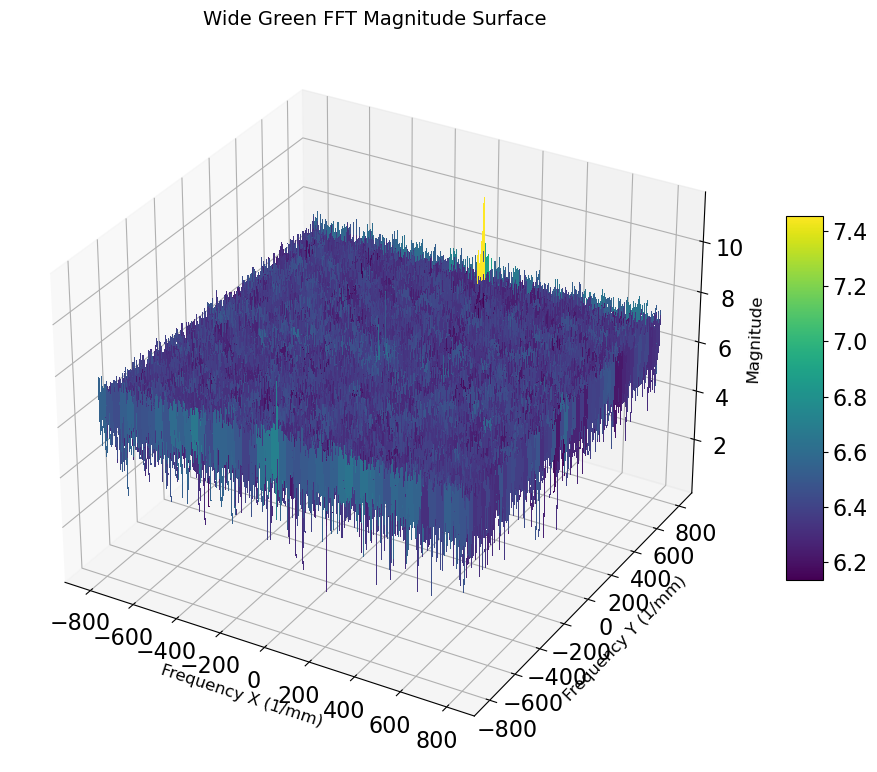

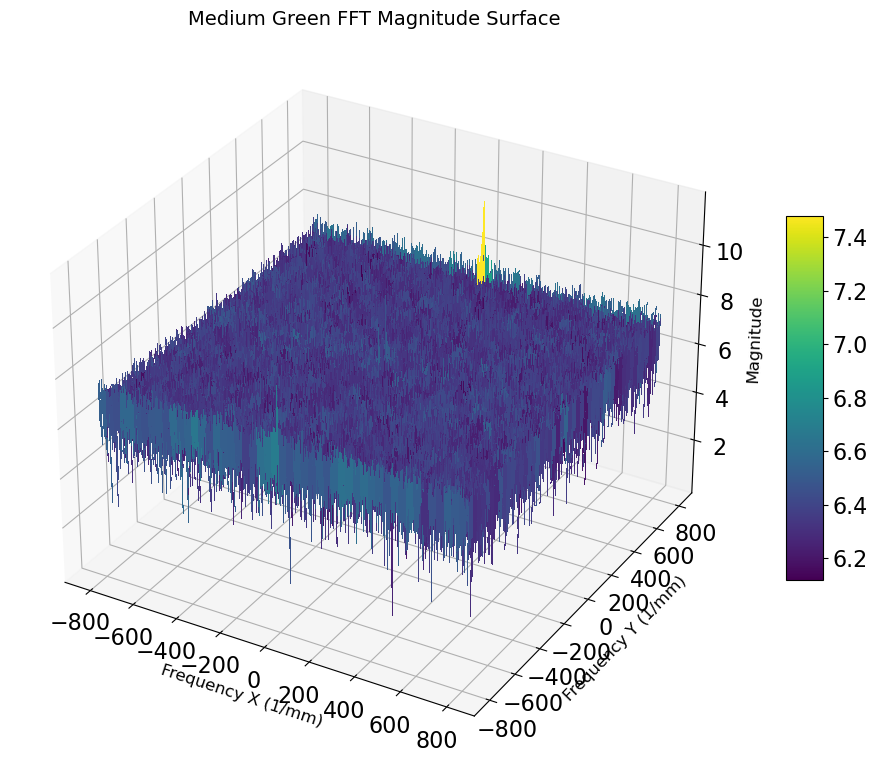

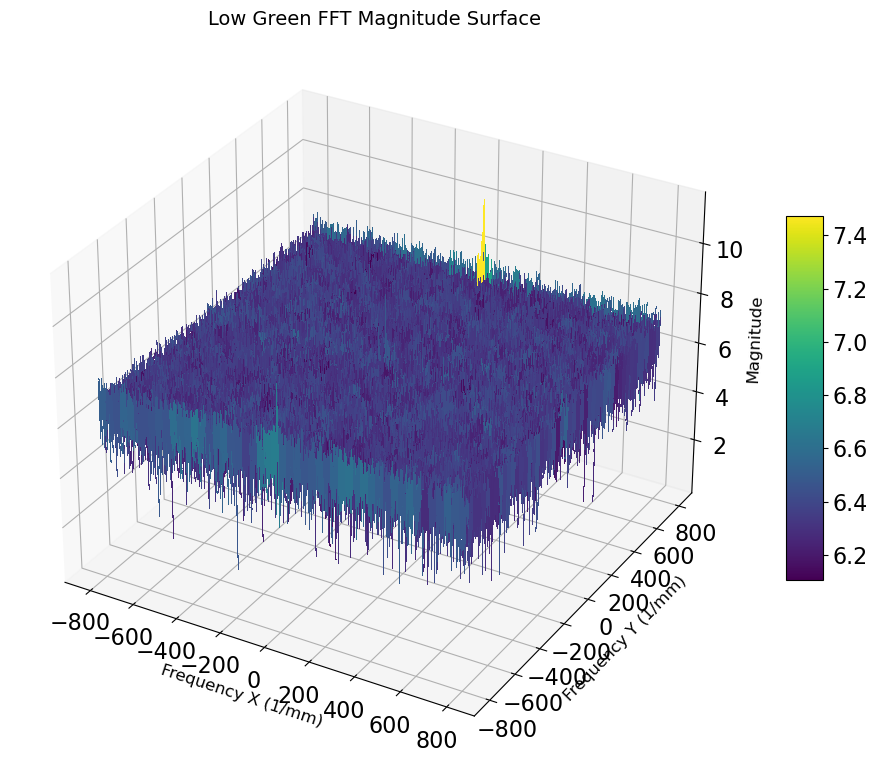

(array([[7.70355832, 5.76228873, 5.39267725, ..., 7.04326664, 5.39267725,
         5.76228873],
        [7.1137036 , 7.51887916, 6.5861668 , ..., 7.65078791, 7.06136575,
         6.71455728],
        [7.5275313 , 7.23854157, 5.83198539, ..., 6.45295002, 6.891108  ,
         5.5969573 ],
        ...,
        [6.57858214, 4.40203326, 5.09294763, ..., 6.77092912, 6.78245264,
         7.10624985],
        [7.5275313 , 5.5969573 , 6.891108  , ..., 6.69803783, 5.83198539,
         7.23854157],
        [7.1137036 , 6.71455728, 7.06136575, ..., 6.89723192, 6.5861668 ,
         7.51887916]]),
 array([-802.54113018, -801.42648972, -800.31184926, ...,  799.1972088 ,
         800.31184926,  801.42648972]),
 array([-802.54113018, -801.0549429 , -799.56875562, ...,  798.08256834,
         799.56875562,  801.0549429 ]))

In [8]:
plotsurface_mm(green_darkfield, mm_per_pixel=(6.230210280811735e-07*1000), title="Green Darkfield FFT Magnitude Surface", zlim=None, use_log=True)
plotsurface_mm(wide_green, mm_per_pixel=(6.230210280811735e-07*1000), title="Wide Green FFT Magnitude Surface", zlim=None, use_log=True)
plotsurface_mm(medium_green, mm_per_pixel=(6.230210280811735e-07*1000), title="Medium Green FFT Magnitude Surface", zlim=None, use_log=True)
plotsurface_mm(low_green, mm_per_pixel=(6.230210280811735e-07*1000), title="Low Green FFT Magnitude Surface", zlim=None, use_log=True)

In [10]:
!pip install ipympl

  Obtaining dependency information for ipympl from https://files.pythonhosted.org/packages/86/6b/21c62f1b2b5e18c6553f7364487dfdf7eb7952b1000a1b7863c1f97819e9/ipympl-0.9.7-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.7/515.7 kB 14.6 MB/s eta 0:00:00


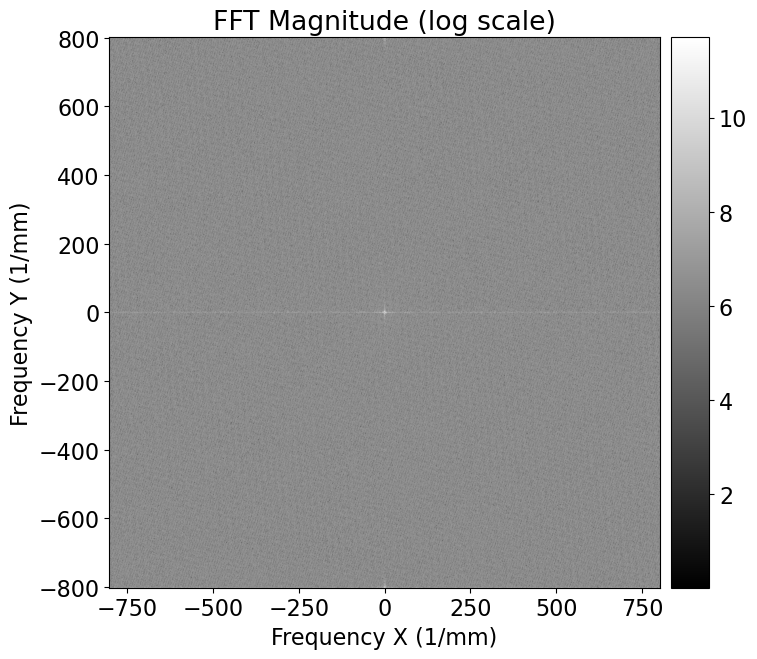

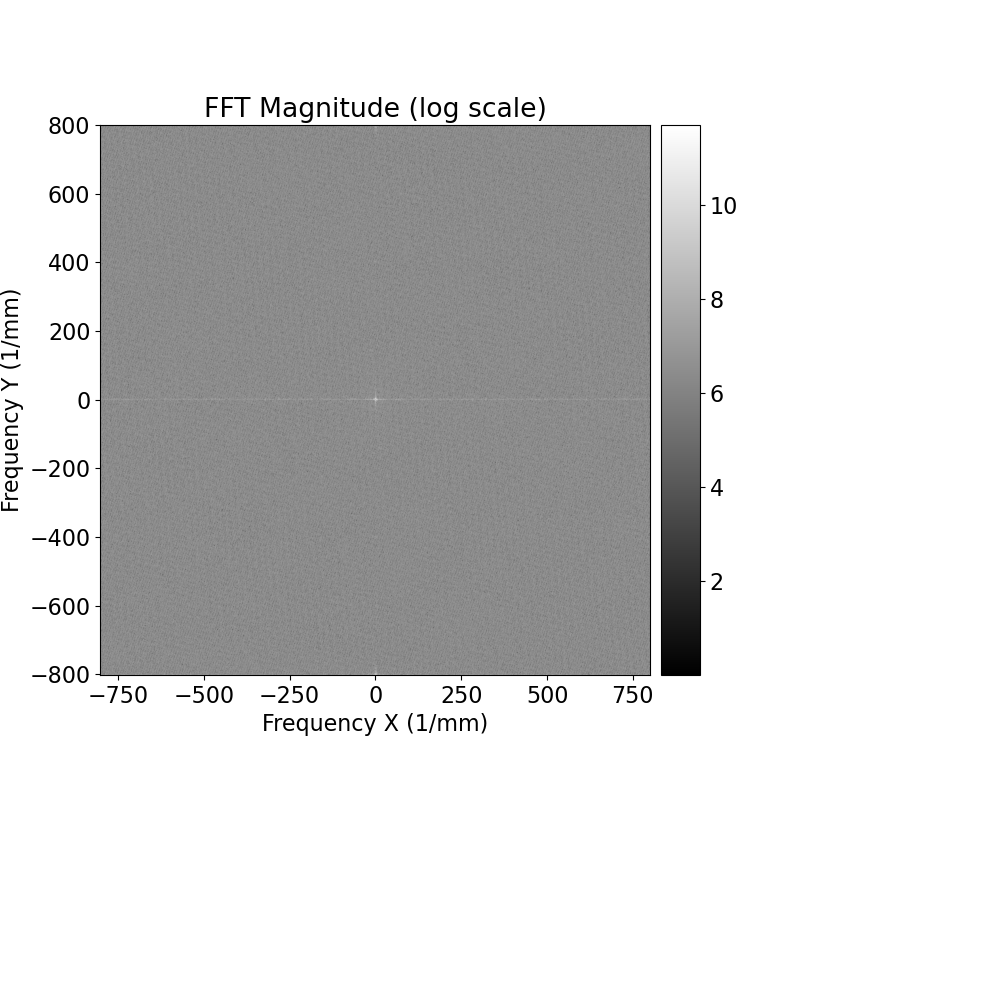

In [19]:
fft_diameter_widget(wide_green, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

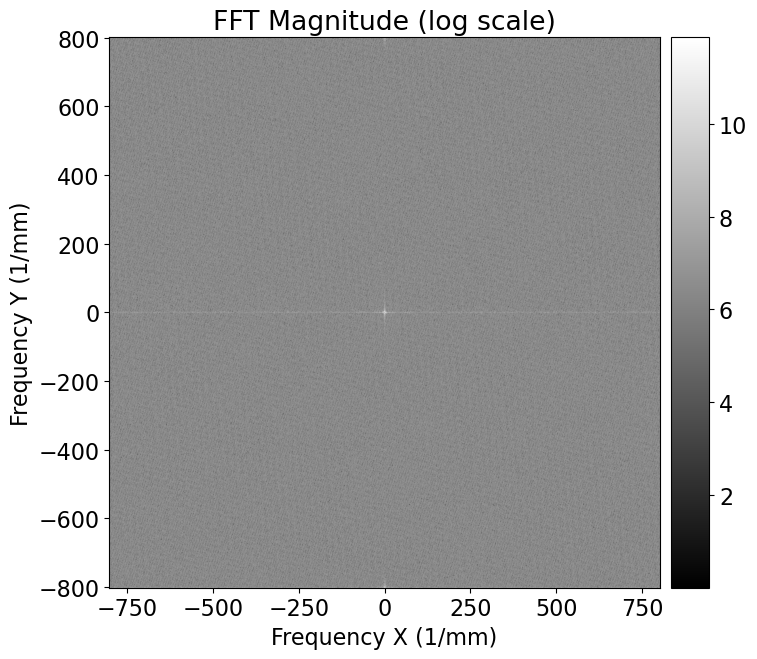

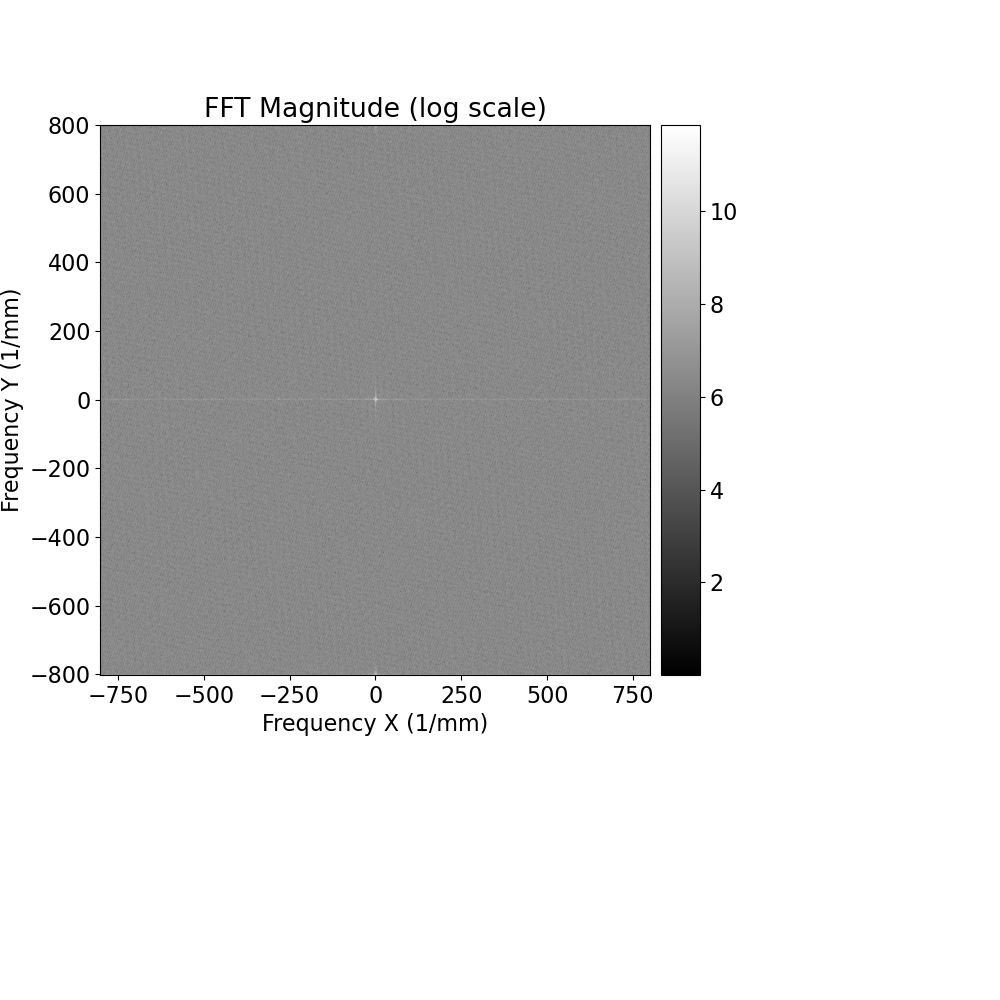

In [20]:
fft_diameter_widget(medium_green, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

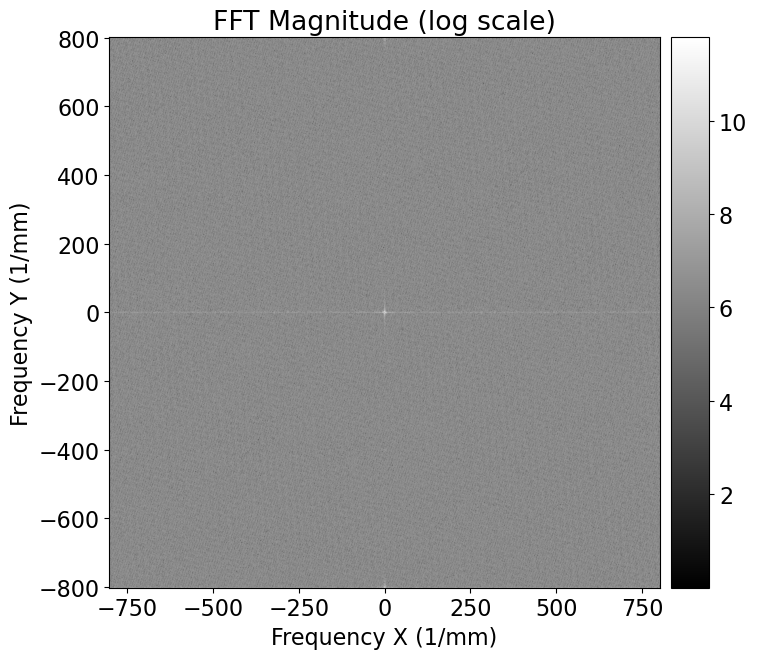

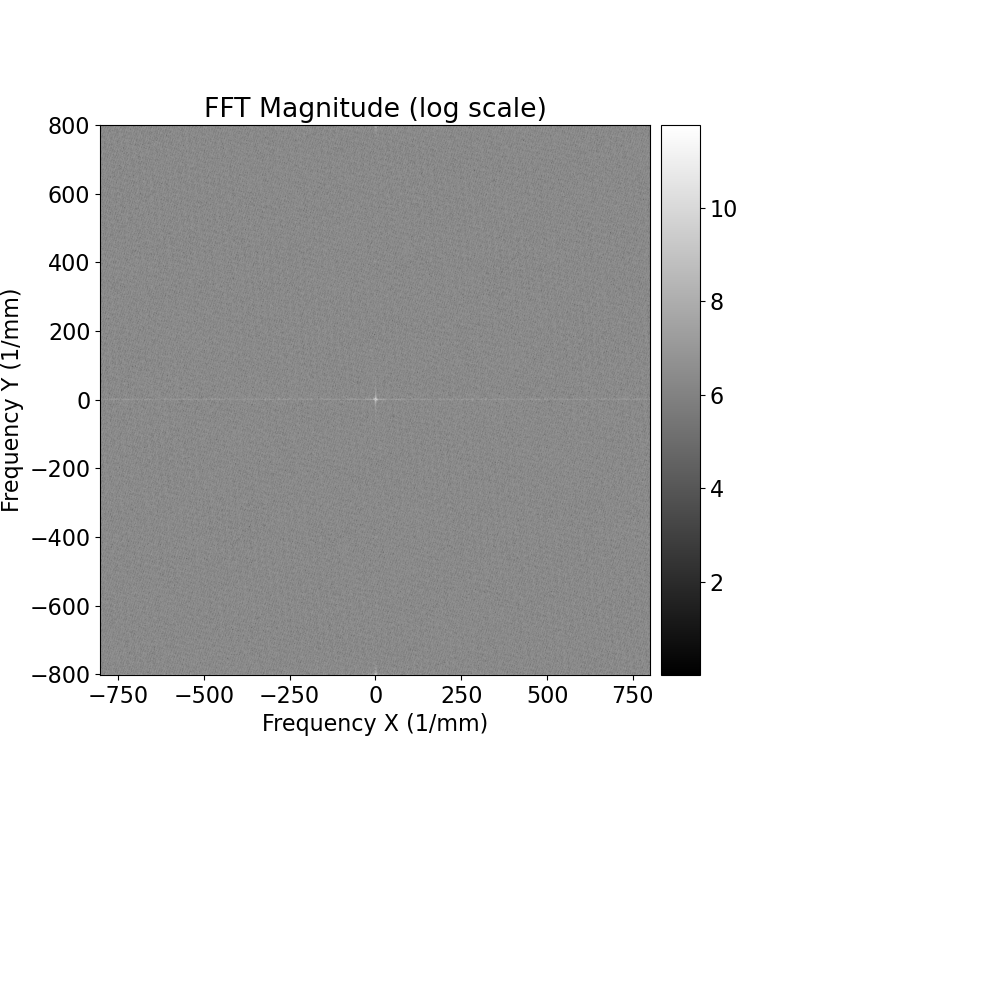

In [21]:
fft_diameter_widget(low_green, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

Estimated diameter in fourier domain:

Wide -> -0.62 to 0.46 => 1.08 (1/mm units)

Medium -> -0.6 to 0.33 => 0.93 (1/mm units)

Low -> -0.55 to 0.36 => 0.91 (1/mm units)



We are being asked to estimate how far from the center (DC) the frequency content extends from the center.

For each dataset, we plotted the absolute value of the 2D Fourier transform using ax.plot_surface(). The resulting plots show a narrow, centered spike, which corresponds to the DC component and reflects the mean intensity of the original image. This spike is very sharp and dominates the center of the plot.

Beyond the spike, we observed significant background noise spread throughout the frequency domain, suggesting a lack of strong periodic structure in the data. The noise appears relatively uniform, with no clear secondary peaks or dominant frequency components. This indicates that most of the energy is concentrated at low frequencies, with no highly structured repeating patterns.

<div class="alert alert-block alert-success">
<font color='black'>

7. Return to the wide open aperture scenario with a centered pinhole, 200 x 200 image and **switch to filter 1 ("blue" 460 nm)**. Choose an appropriate exposure and dark-correct your data. Show a best-focus image, windowed image to see sidelobes, and the magnitude of the Fourier transform of this image. Save your image data. Additionally, estimate the diameter of the first dark ring in the image and the diameter of the Fourier-domain function. Show all of this below and discuss the relation to the in-focus filter 2 case.  </font> 
</div>

In [8]:
blue_darkfield = average_images(50)
np.save("blue_darkfield", blue_darkfield)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50


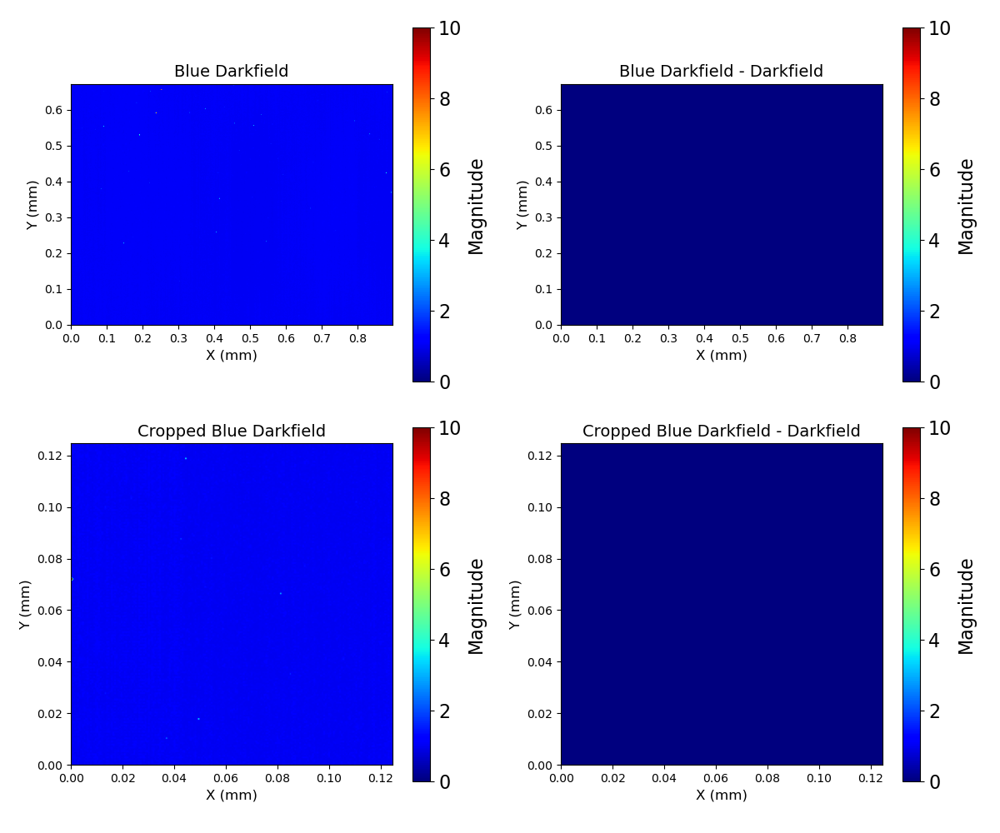

(array([[1.06, 1.04, 1.12, ..., 1.08, 1.1 , 1.02],
        [1.04, 1.  , 1.04, ..., 1.  , 1.02, 1.06],
        [1.02, 1.04, 1.  , ..., 1.06, 1.06, 1.02],
        ...,
        [1.  , 1.06, 1.02, ..., 1.06, 1.  , 1.08],
        [1.02, 1.08, 1.08, ..., 1.02, 1.02, 1.06],
        [1.  , 1.  , 1.12, ..., 1.06, 1.04, 1.14]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([[1.  , 1.04, 1.1 , ..., 1.08, 1.04, 1.02],
        [1.  , 1.02, 1.08, ..., 1.02, 1.04, 1.  ],
        [1.  , 1.  , 1.16, ..., 1.06, 1.  , 1.  ],
        ...,
        [1.08, 1.12, 1.04, ..., 1.  , 1.02, 1.02],
        [1.02, 1.04, 1.04, ..., 1.08, 1.  , 1.  ],
        [1.06, 1.06, 1.04, ..., 1.08, 1.02, 1.  ]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0

In [22]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 10
show_zoomed(blue_darkfield, blue_darkfield, x1, y1, x2, y2, image_name='Blue Darkfield', cropped_image_name='Cropped Blue Darkfield', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

In [77]:
wide_blue = average_images(100)
np.save("wide_blue", wide_blue)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


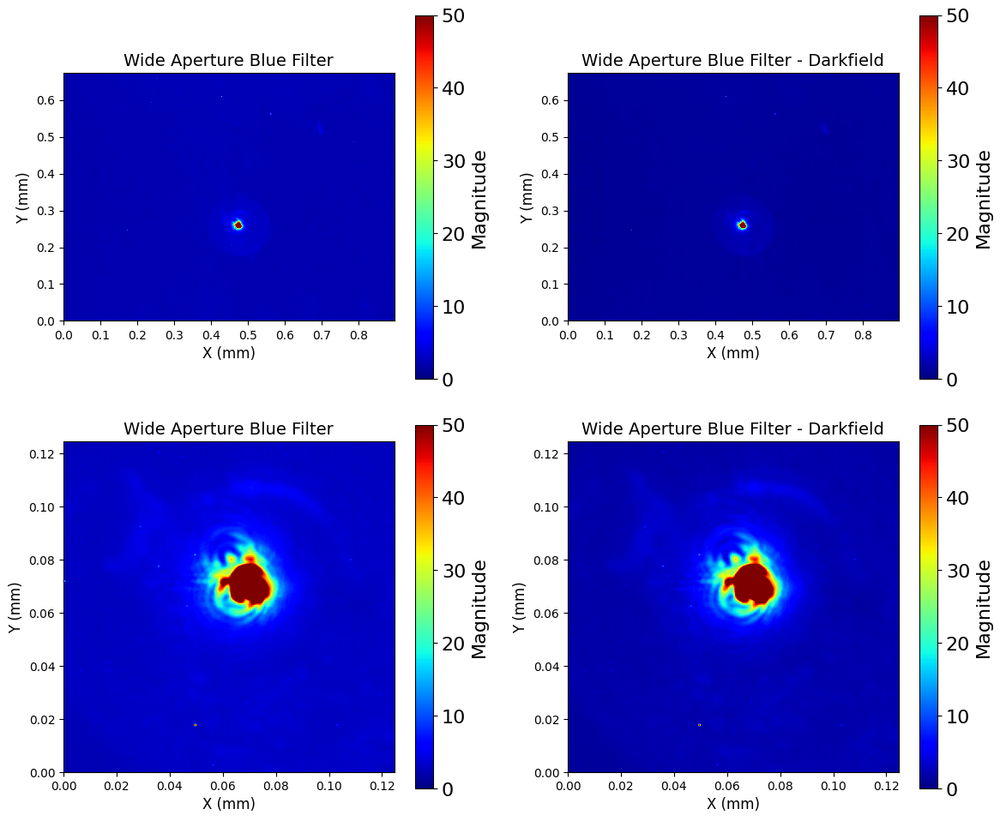

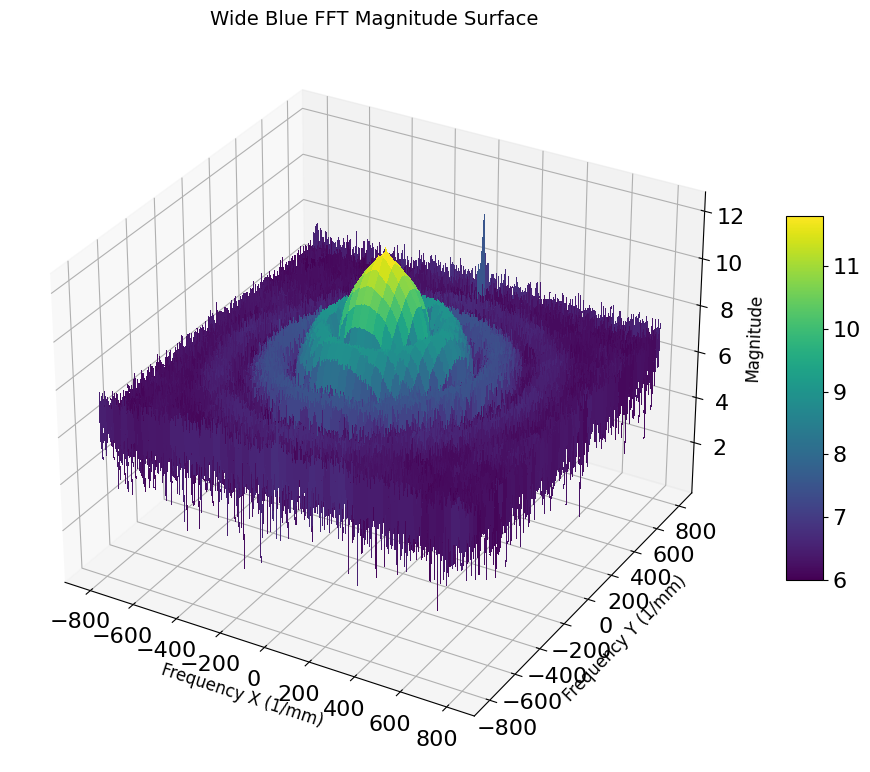

(array([[7.06510939, 5.60920067, 5.58068035, ..., 7.06085835, 5.58068035,
         5.60920067],
        [7.29679224, 7.48426277, 5.67334227, ..., 7.2900458 , 7.15603886,
         7.31066241],
        [7.17482634, 6.84272762, 5.60811161, ..., 6.0320111 , 6.29947346,
         5.4295849 ],
        ...,
        [6.69317839, 5.93184359, 5.75635544, ..., 6.76669259, 7.04837687,
         7.25640549],
        [7.17482634, 5.4295849 , 6.29947346, ..., 6.2652934 , 5.60811161,
         6.84272762],
        [7.29679224, 7.31066241, 7.15603886, ..., 6.9660175 , 5.67334227,
         7.48426277]]),
 array([-802.54113018, -801.42648972, -800.31184926, ...,  799.1972088 ,
         800.31184926,  801.42648972]),
 array([-802.54113018, -801.0549429 , -799.56875562, ...,  798.08256834,
         799.56875562,  801.0549429 ]))

In [51]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 50
show_zoomed(wide_blue_defocus1, blue_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Blue Filter', cropped_image_name='Wide Aperture Blue Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
plotsurface_mm(wide_blue_defocus1, mm_per_pixel=(6.230210280811735e-07*1000), title="Wide Blue FFT Magnitude Surface", zlim=None, use_log=True)

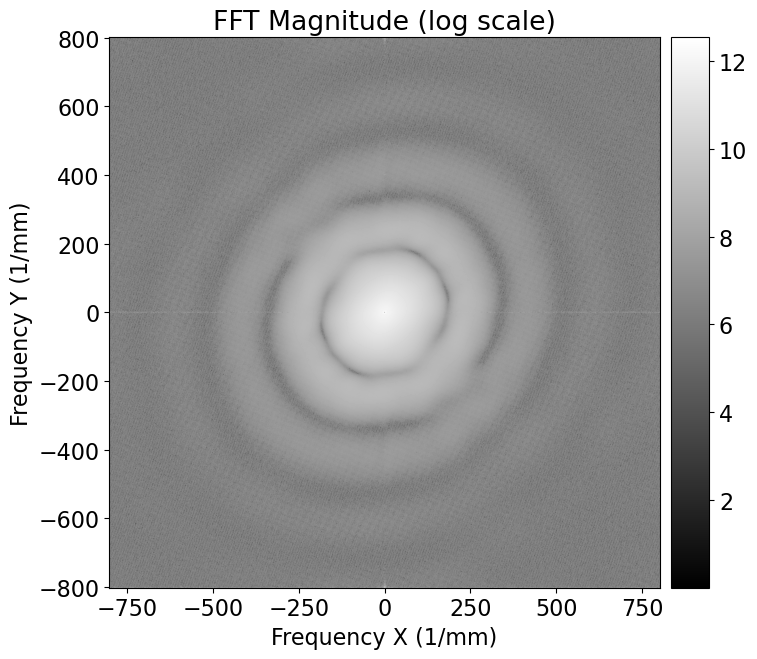

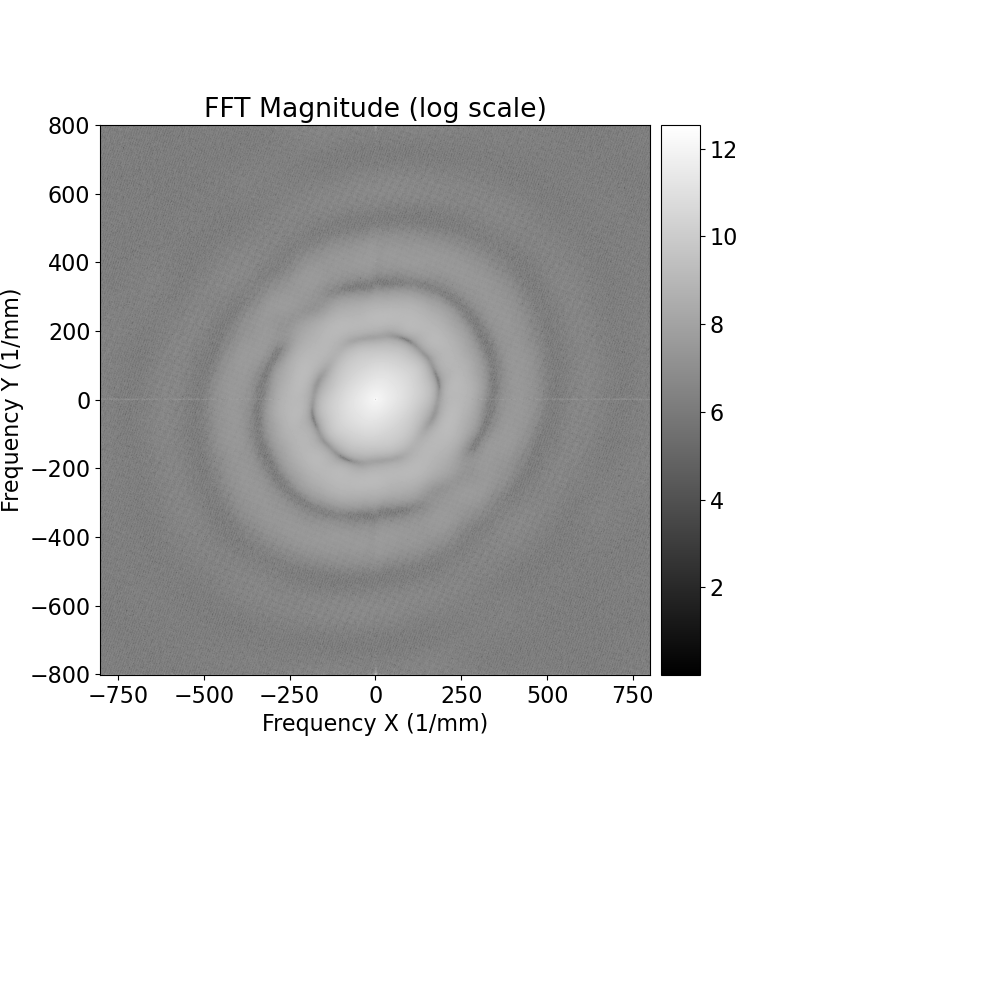

In [23]:
fft_diameter_widget(wide_blue_defocus1, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

Estimated diameter in image -> 0.02 mm in diameter


Estimated diameter in fourier domain -> -183 to 187 => 370 (1/mm)

In comparison to the filter 2 case, filter 1 has a lower wavelength. As a result, the image must be less bright/intense but provide greater resolution. Unfortunately, our data using the filter 1 was too low brightness and we were limited by our setup. Thus the images provided are from a no filter setup. In theory, we would expect a lower brightness but greater clarity / less blur in comparison to filter 2

<div class="alert alert-block alert-success">
<font color='black'>

8. Defocus your pinhole image at three different levels of defocus (showing different ring behavior around the pinhole). Average 100 frames, save this data and show below. Describe general trends in the defocused data. </font> 
</div>

In [36]:
defocus_level1_nofilter = continuous_capture_jet(save_name="defocus_level1_nofilter")

UnboundLocalError: local variable 'image' referenced before assignment

In [37]:
wide_blue_defocus1 = average_images(100)
np.save("wide_blue_defocus1", wide_blue_defocus1)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


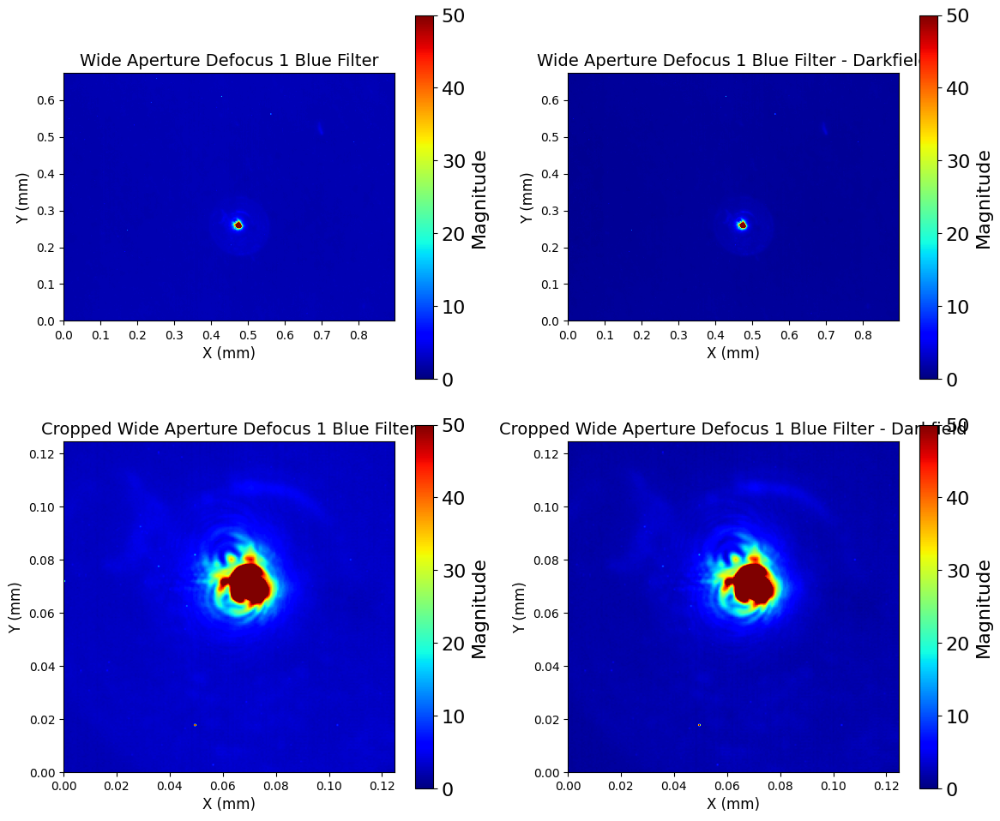

(array([[1.88, 1.97, 1.78, ..., 2.17, 2.13, 2.06],
        [2.12, 1.82, 1.92, ..., 2.11, 1.9 , 2.05],
        [1.8 , 1.96, 1.74, ..., 2.03, 2.31, 2.25],
        ...,
        [1.9 , 2.32, 2.06, ..., 2.25, 2.59, 2.26],
        [2.2 , 2.17, 2.1 , ..., 2.19, 2.46, 2.33],
        [2.12, 2.02, 2.31, ..., 2.47, 2.57, 2.47]]),
 array([[0.82, 0.93, 0.66, ..., 1.09, 1.03, 1.04],
        [1.08, 0.82, 0.88, ..., 1.11, 0.88, 0.99],
        [0.78, 0.92, 0.74, ..., 0.97, 1.25, 1.23],
        ...,
        [0.9 , 1.26, 1.04, ..., 1.19, 1.59, 1.18],
        [1.18, 1.09, 1.02, ..., 1.17, 1.44, 1.27],
        [1.12, 1.02, 1.19, ..., 1.41, 1.53, 1.33]]),
 array([[2.08, 2.58, 2.36, ..., 2.73, 2.7 , 2.65],
        [2.35, 2.36, 2.25, ..., 2.31, 2.58, 2.62],
        [3.98, 2.25, 2.34, ..., 2.91, 3.03, 2.74],
        ...,
        [2.66, 2.58, 2.3 , ..., 2.63, 2.93, 2.9 ],
        [2.28, 2.55, 2.5 , ..., 2.87, 2.89, 2.66],
        [2.6 , 2.69, 2.24, ..., 2.85, 2.72, 2.84]]),
 array([[1.08, 1.54, 1.26, ..., 1.65,

In [24]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 50
show_zoomed(wide_blue_defocus1, blue_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Defocus 1 Blue Filter', cropped_image_name='Cropped Wide Aperture Defocus 1 Blue Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)

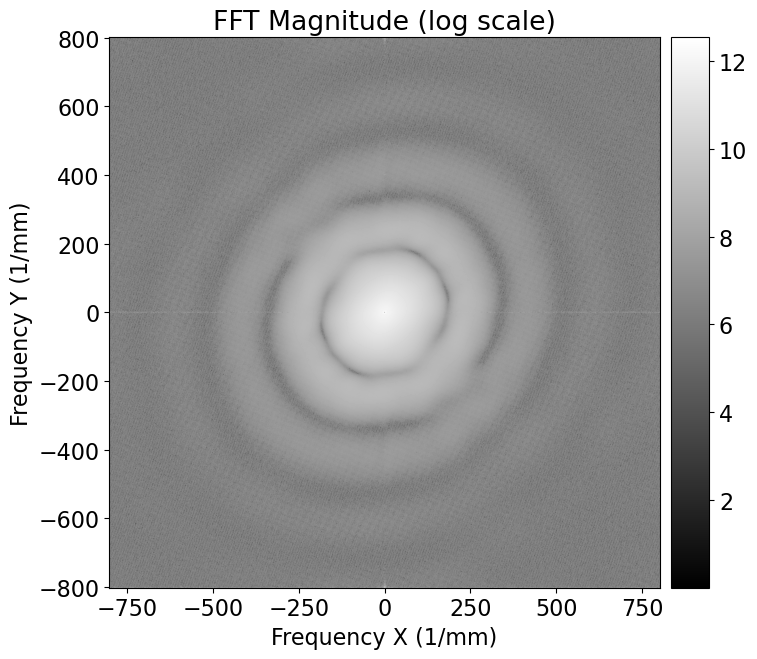

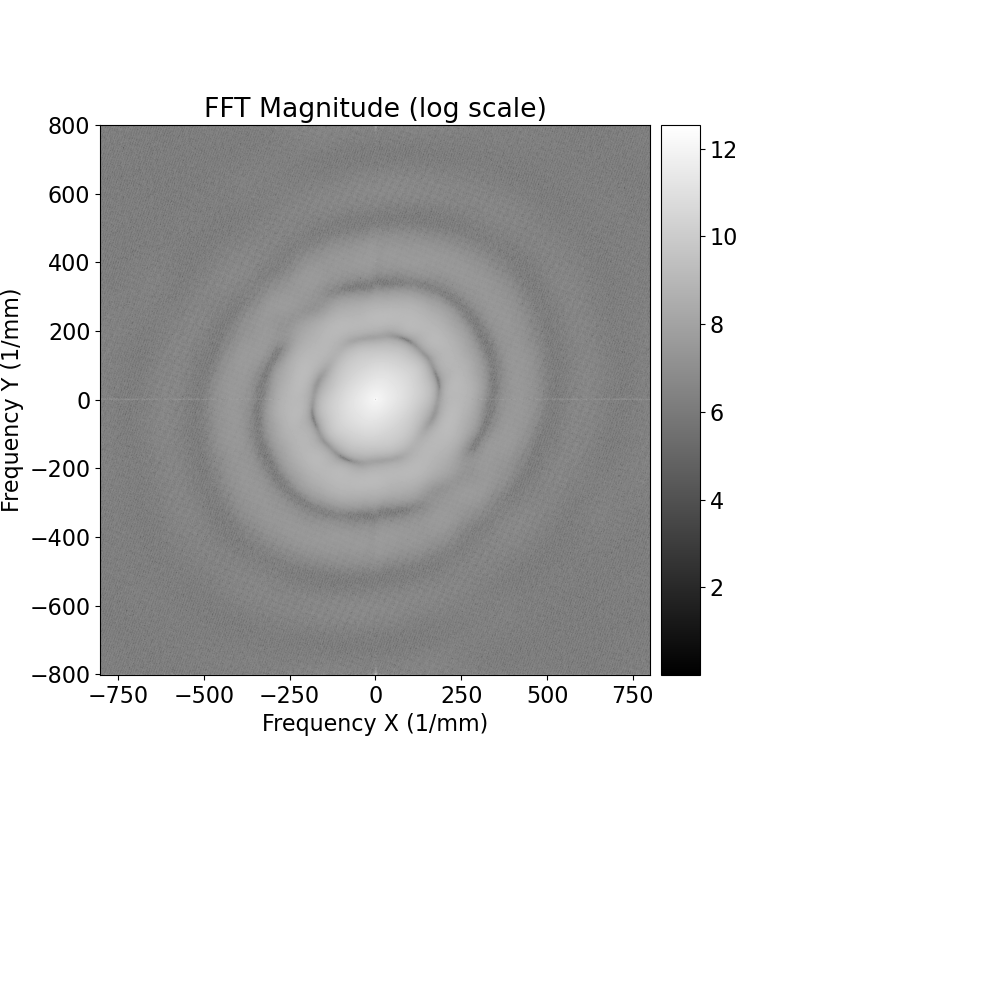

In [26]:
fft_diameter_widget(wide_blue_defocus1, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

Estimated diameter in image -> 0.02 mm in diameter


Estimated diameter in fourier domain -> 370 (1/mm)

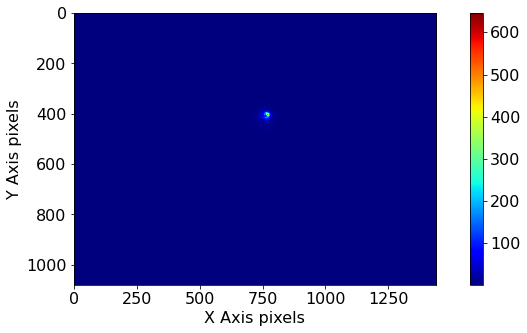

In [30]:
defocus_level2_nofilter = continuous_capture_jet(save_name="defocus_level2_nofilter")

In [31]:
wide_blue_defocus2 = average_images(100)
np.save("wide_blue_defocus2", wide_blue_defocus2)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


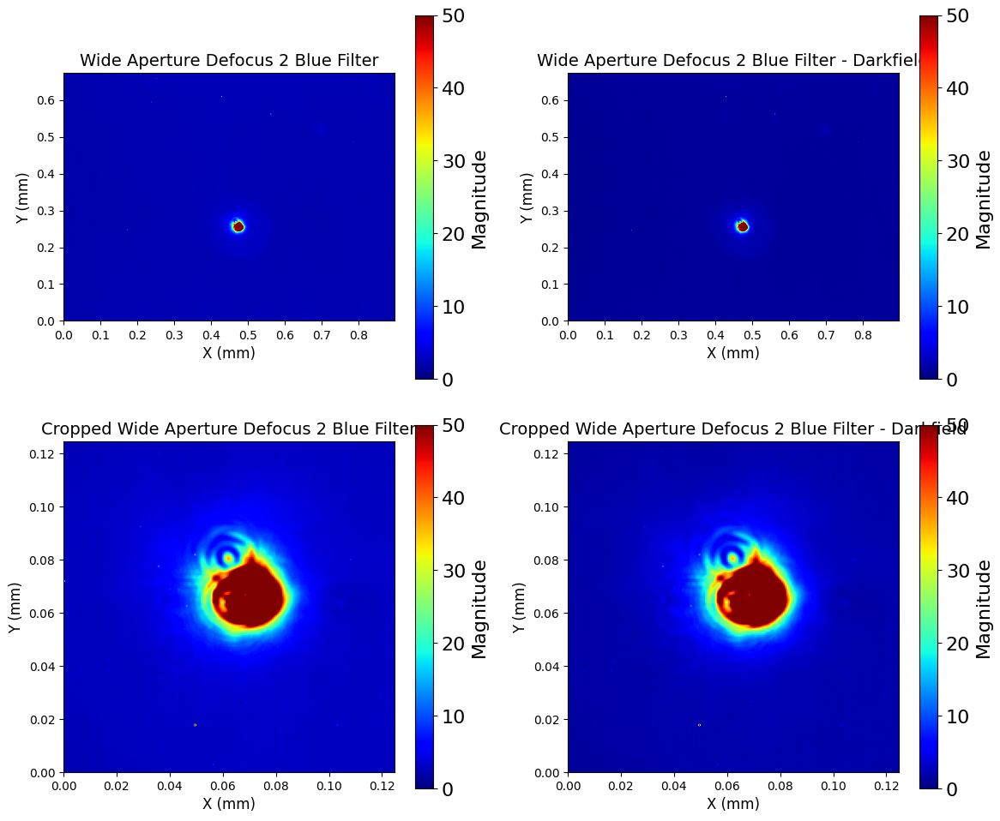

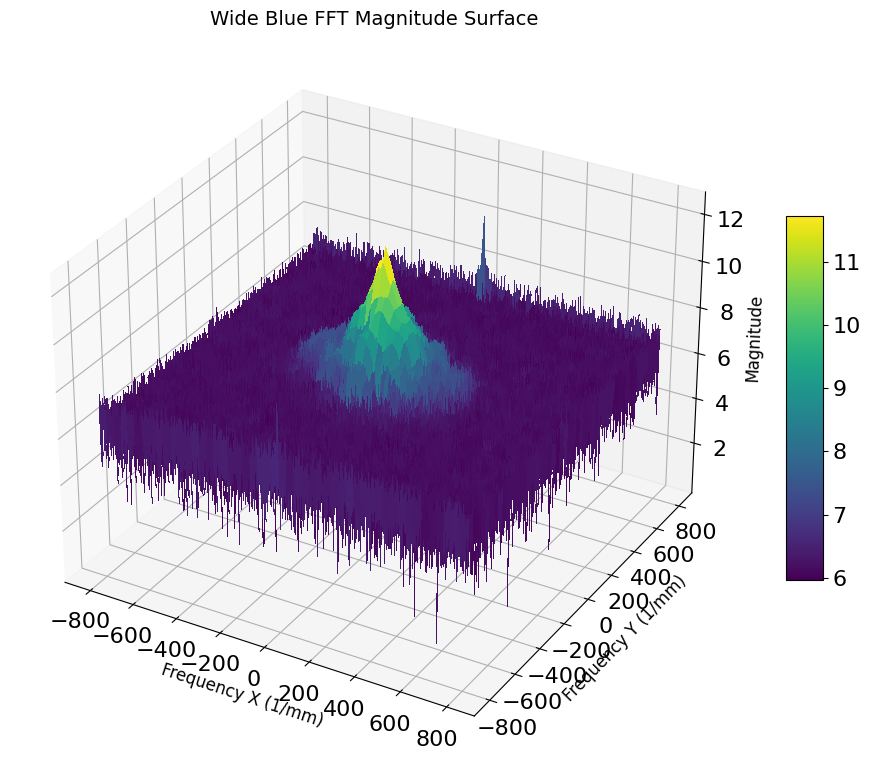

(array([[7.35931486, 5.03039379, 4.7957104 , ..., 7.24338464, 4.7957104 ,
         5.03039379],
        [7.2479092 , 7.30555642, 6.26592198, ..., 7.3979492 , 6.93285622,
         7.21588352],
        [7.37849541, 7.04258892, 3.53522466, ..., 6.11122545, 6.31725558,
         5.80254457],
        ...,
        [6.52467716, 5.37525034, 5.19456825, ..., 6.69186334, 6.89109544,
         6.95102863],
        [7.37849541, 5.80254457, 6.31725558, ..., 6.59528099, 3.53522466,
         7.04258892],
        [7.2479092 , 7.21588352, 6.93285622, ..., 6.73403838, 6.26592198,
         7.30555642]]),
 array([-802.54113018, -801.42648972, -800.31184926, ...,  799.1972088 ,
         800.31184926,  801.42648972]),
 array([-802.54113018, -801.0549429 , -799.56875562, ...,  798.08256834,
         799.56875562,  801.0549429 ]))

In [54]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 50
show_zoomed(wide_blue_defocus2, blue_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Defocus 2 Blue Filter', cropped_image_name='Cropped Wide Aperture Defocus 2 Blue Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
plotsurface_mm(wide_blue_defocus2, mm_per_pixel=(6.230210280811735e-07*1000), title="Wide Blue FFT Magnitude Surface", zlim=None, use_log=True)

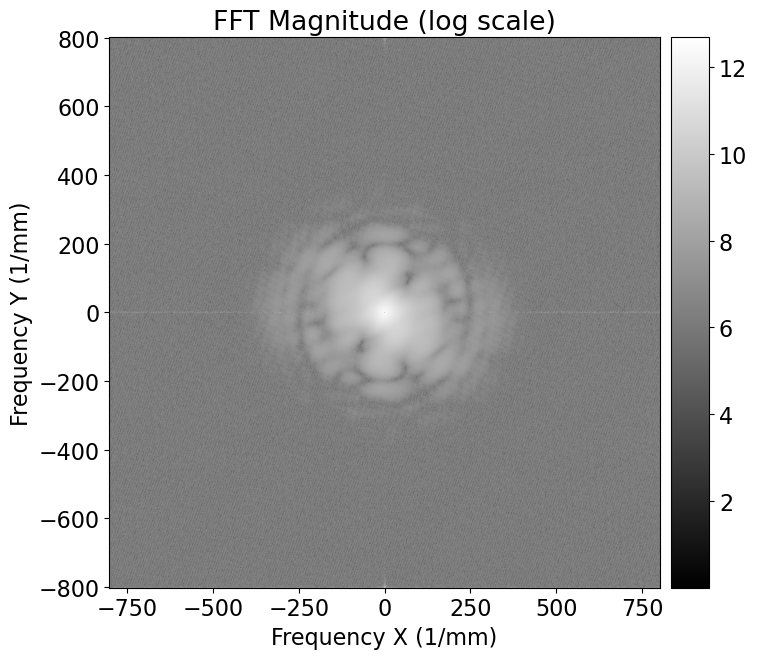

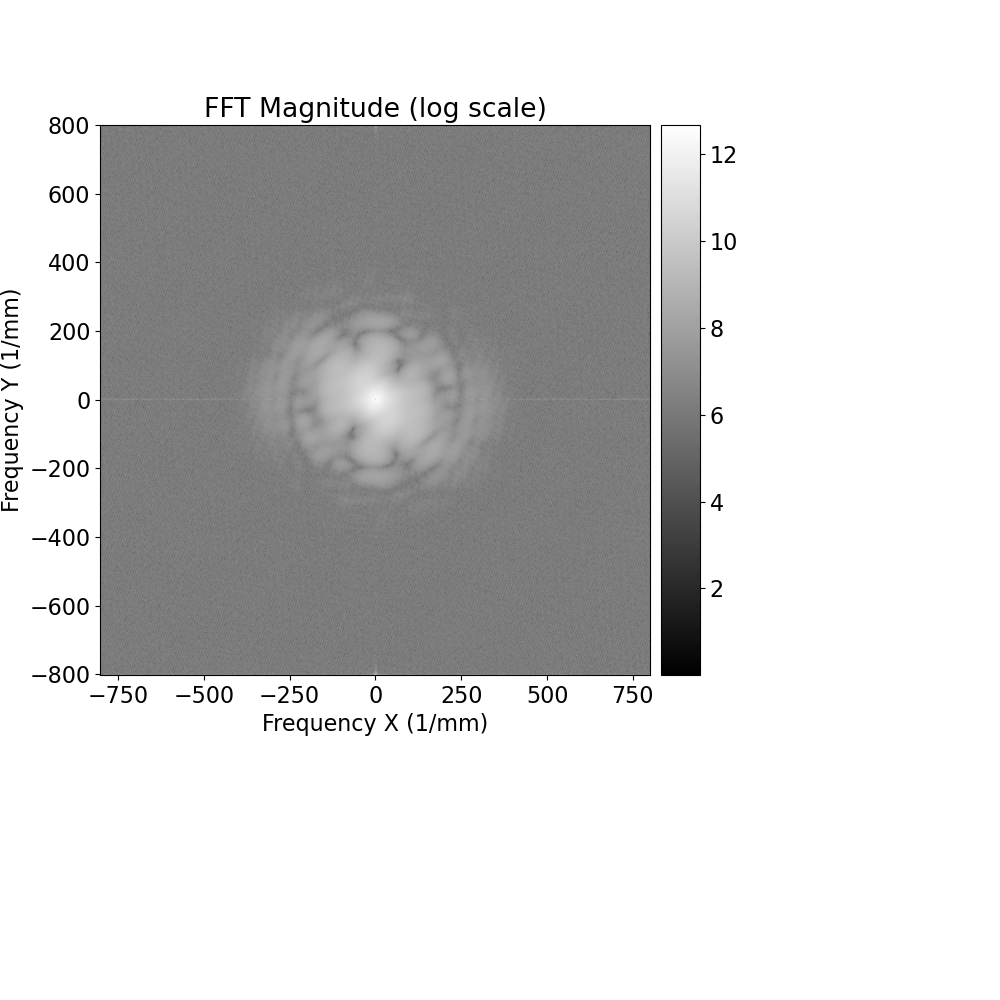

In [24]:
fft_diameter_widget(wide_blue_defocus2, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

Estimated diameter in image -> 0.03 mm in diameter


Estimated diameter in fourier domain -> -104 to 94 => 198 (1/mm)

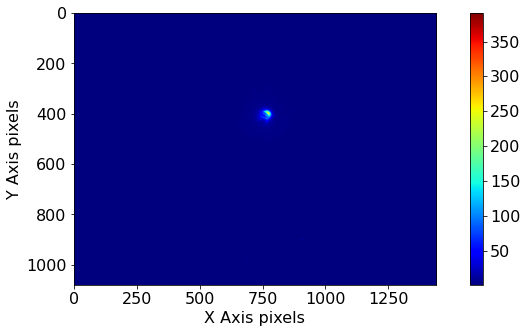

In [25]:
defocus_level3_nofilter = continuous_capture_jet(save_name="defocus_level3_nofilter")

In [26]:
wide_blue_defocus3 = average_images(100)
np.save("wide_blue_defocus3", wide_blue_defocus3)

image number taken: 10
image number taken: 20
image number taken: 30
image number taken: 40
image number taken: 50
image number taken: 60
image number taken: 70
image number taken: 80
image number taken: 90
image number taken: 100


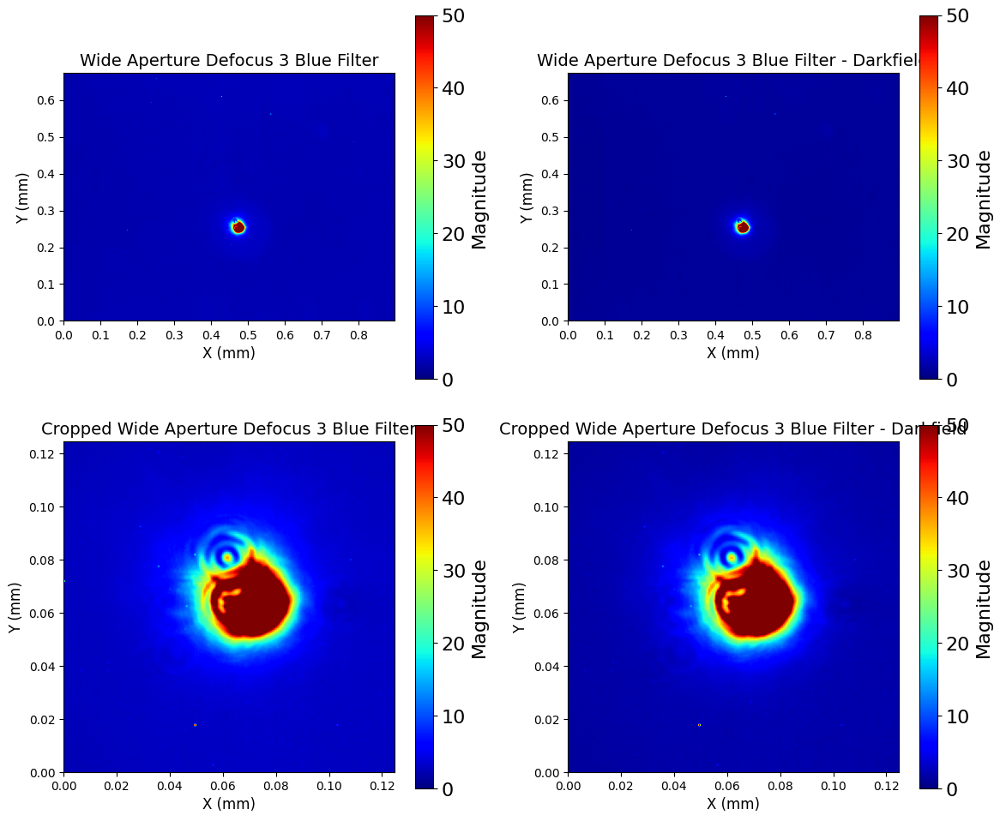

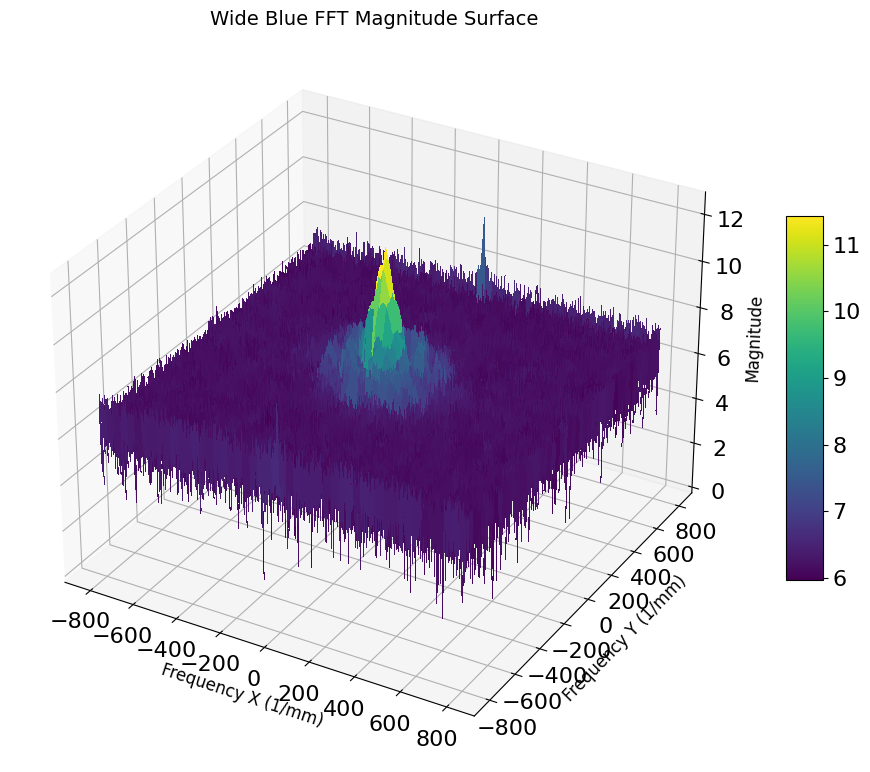

(array([[7.3746729 , 5.07281999, 4.61063551, ..., 7.24505956, 4.61063551,
         5.07281999],
        [7.23783559, 7.3245577 , 6.18924497, ..., 7.38554641, 6.89698156,
         7.12650132],
        [7.38815702, 7.12694897, 3.50054139, ..., 6.24748086, 6.17120417,
         5.84290459],
        ...,
        [6.42817087, 4.380206  , 5.39156898, ..., 6.53053106, 6.72804947,
         7.00524287],
        [7.38815702, 5.84290459, 6.17120417, ..., 6.49996875, 3.50054139,
         7.12694897],
        [7.23783559, 7.12650132, 6.89698156, ..., 6.7017887 , 6.18924497,
         7.3245577 ]]),
 array([-802.54113018, -801.42648972, -800.31184926, ...,  799.1972088 ,
         800.31184926,  801.42648972]),
 array([-802.54113018, -801.0549429 , -799.56875562, ...,  798.08256834,
         799.56875562,  801.0549429 ]))

In [55]:
x1,y1,x2,y2 = 650, 300, 850, 500
vmin, vmax = 0, 50
show_zoomed(wide_blue_defocus3, blue_darkfield, x1, y1, x2, y2, image_name='Wide Aperture Defocus 3 Blue Filter', cropped_image_name='Cropped Wide Aperture Defocus 3 Blue Filter', mm_per_pixel = (6.230210280811735e-07*1000), vmin=vmin, vmax=vmax)
plotsurface_mm(wide_blue_defocus3, mm_per_pixel=(6.230210280811735e-07*1000), title="Wide Blue FFT Magnitude Surface", zlim=None, use_log=True)

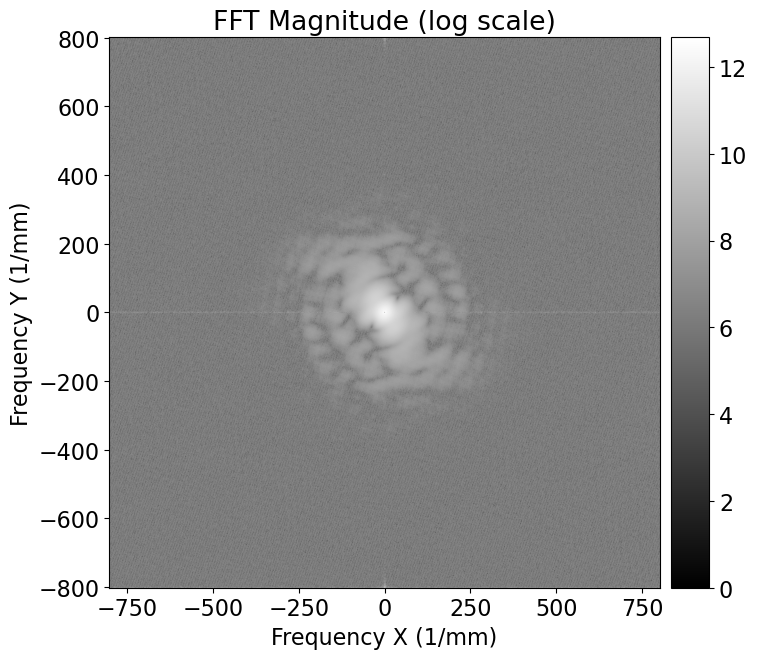

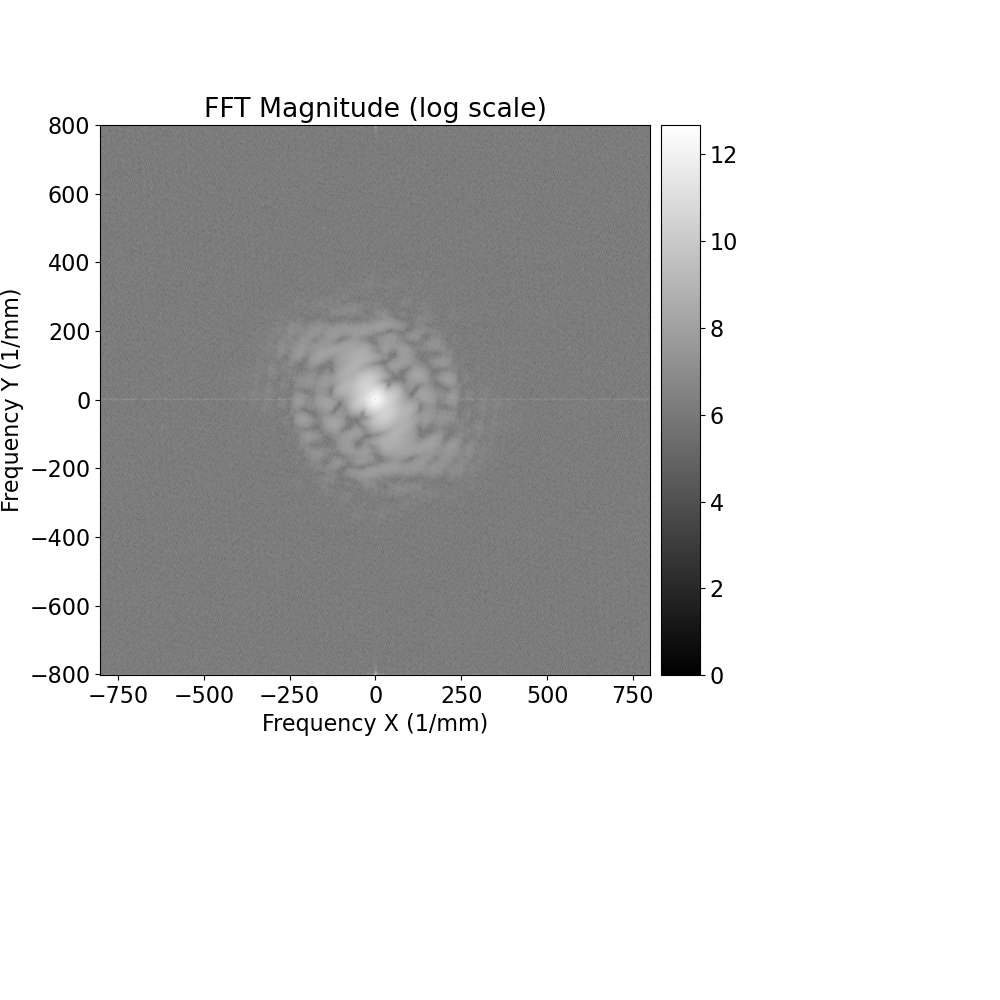

In [25]:
fft_diameter_widget(wide_blue_defocus3, mm_per_pixel=(6.230210280811735e-07*1000), use_log=True)

Estimated diameter in image -> 0.035 mm in diameter


Estimated diameter in fourier domain -> -58 to 82 => 140 (1/mm)

As the data becomes more and more defocused, the pinhole image shown from the camera becomes larger but gets less intense and more blurry. This is seen in the diameters of the spatial domain graphs as they increase from 0.02 to 0.03 and 0.035 mm. In contrast, the fourier domain rings get smaller and more narrow. Since there is less detail and the images are more blurry, there is less higher frequency in the fourier domain, leaving a narrow spike at the lower frequencies. This is seen as the diameters from 370, 198, to 140 (1/mm).

In comparison to the filter 2 case, filter 1 has a lower wavelength. As a result, the image must be less bright/intense but provide greater resolution. Unfortunately, our data using the filter 1 was too low brightness and we were limited by our setup. Thus the images provided are from a no filter setup. In theory, we would expect a lower brightness but greater clarity / less blur in comparison to filter 2

<div class="alert alert-block alert-success">
<font color='black'>

9. Move the stage to center your microscope on the center of the star pattern. Acquire a best focus image at good exposures for both filter 1 ("blue" 460 nm) and filter 3 ("orange" 600 nm) using a 200 x 200 zoomed image region. Show both images and describe what you see – note any differences and interpret the data in light of the other experiments you have conducted.  </font> 
</div>

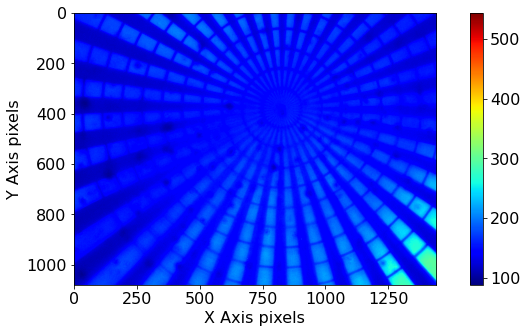

In [57]:
c.set_exposure(1000)
filter1_star = continuous_capture("filter1_star")
np.save("filter1_star", filter1_star)

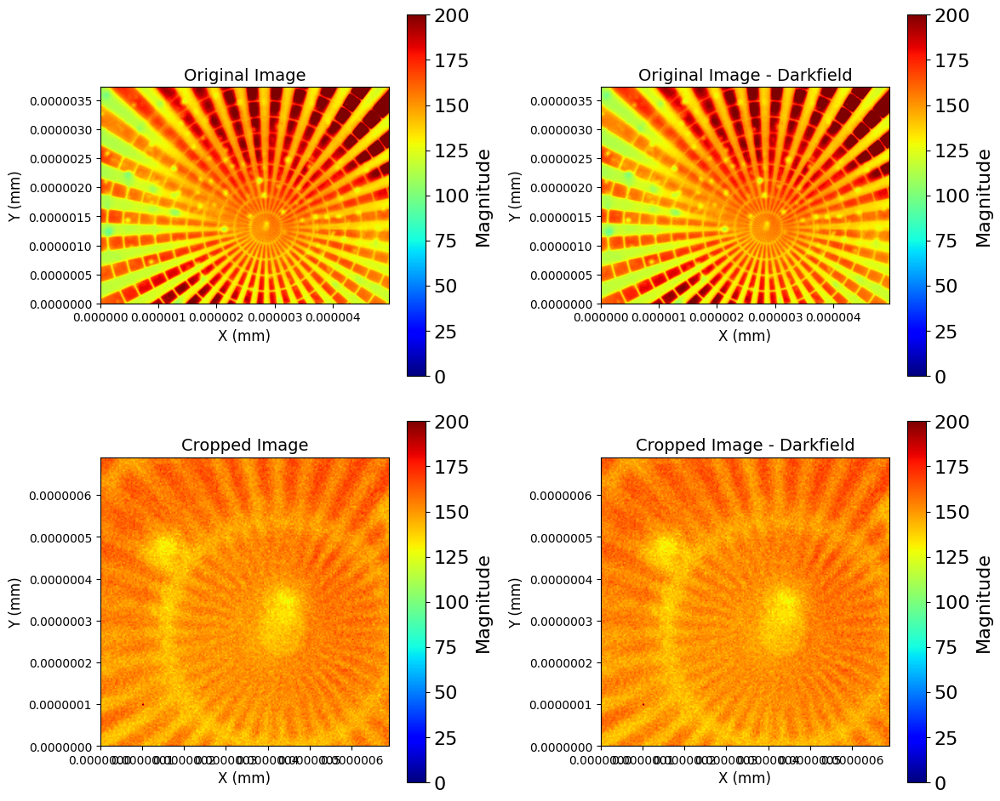

In [27]:
darkfield = np.zeros((1080, 1440))
filter1_star_zoomed = show_zoomed(filter1_star, darkfield, 700, 300, 900, 500)

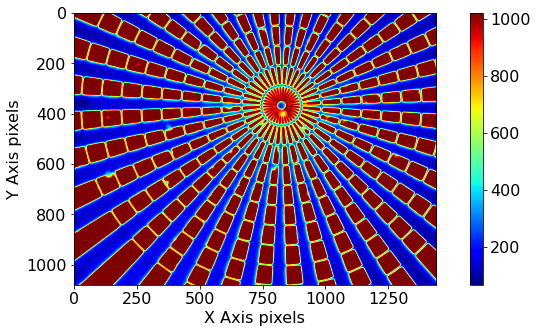

In [60]:
filter3_star = continuous_capture("filter3_star")
np.save("filter3_star", filter3_star)

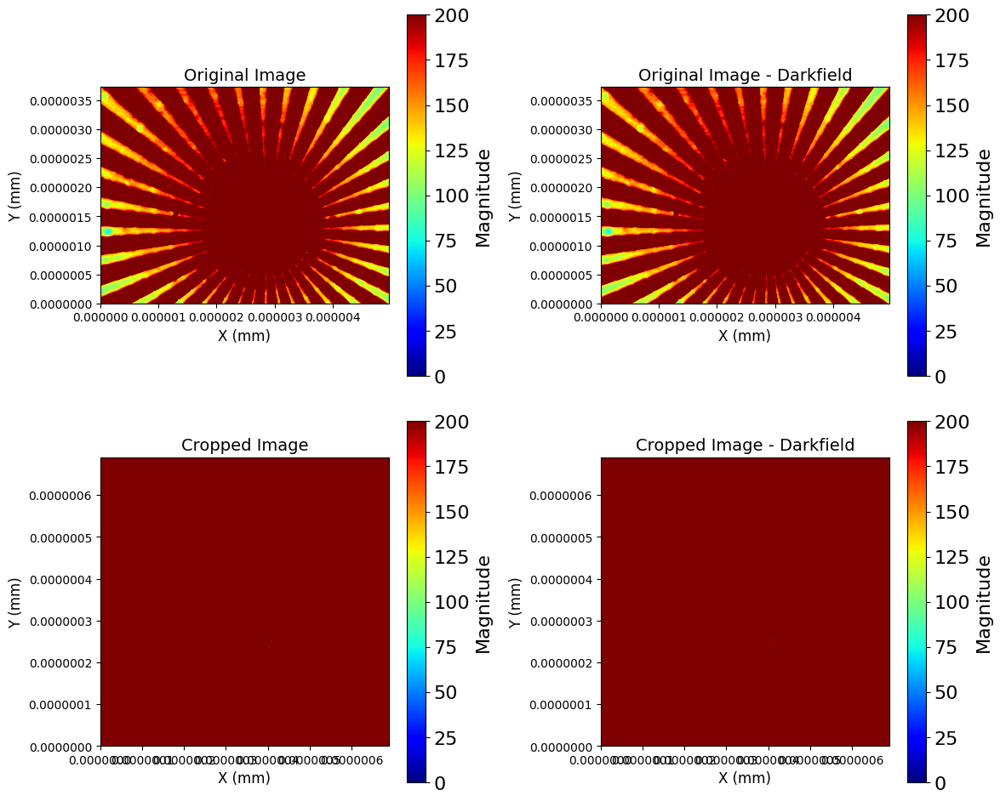

In [28]:
darkfield = np.zeros((1080, 1440))
filter3_star_zoomed = show_zoomed(filter3_star, darkfield, 700, 300, 900, 500)

In [5]:
green_darkfield = np.load("Lab3_IMAGES/green_darkfield.npy")
wide_green = np.load("Lab3_IMAGES/wide_green.npy")
medium_green = np.load("Lab3_IMAGES/medium_green.npy")
low_green = np.load("Lab3_IMAGES/low_green.npy")
blue_darkfield = np.load("Lab3_IMAGES/blue_darkfield.npy")
wide_blue = np.load("Lab3_IMAGES/wide_blue.npy")
wide_blue_defocus1 = np.load("Lab3_IMAGES/wide_blue_defocus1.npy")
wide_blue_defocus2 = np.load("Lab3_IMAGES/wide_blue_defocus2.npy")
wide_blue_defocus3 = np.load("Lab3_IMAGES/wide_blue_defocus3.npy")
filter1_star = np.load("Lab3_IMAGES/filter1_star.npy")
filter3_star = np.load("Lab3_IMAGES/filter3_star.npy")


The orange filter image has a greater intensity because the filter lets more light through. This results in a brighter overall image. Longer wavelengths (600 nm for orange compared to 460 nm for filter 1) tend to penetrate better and scatter less, resulting in brighter images with more uniform illumination. This might make the orange image appear more intense, even if it has worse resolution.

However, the orange (600 nm) filter has better resolution as well. This is unexpected as shorter wavelengths tend to have reduced diffraction and the image should be clearer for the filter 1. The filter 3 lens should be must more blurry because the orange filter has a wavelength of 600 nm which is greater than 460 nm of filter 1 and thus would have greater diffraction. The reason our images look like this is likely due to the cleanliness of the filters themselves. Repeating this test after cleaning the filter may produce results more consistent with current understanding and our hypothesis.